In [1240]:
# General
import sys
import os
import glob
from time import time
from collections import OrderedDict
from importlib import reload
from glob import glob
import itertools

# Scientific
import numpy as np
import pandas as pd
pd.options.display.max_rows = 50
pd.options.display.max_columns = 999
import scipy.io as sio

# Stats
import scipy.stats as stats
import statsmodels.api as sm
import astropy.stats.circstats as circstats
import pycircstat
import random
from sklearn.decomposition import PCA

# Plots
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import matplotlib as mpl
from matplotlib.lines import Line2D
import matplotlib.patches as patches
mpl.rcParams['figure.dpi'] = 300
mpl.rcParams['grid.linewidth'] = 0.1
mpl.rcParams['grid.alpha'] = 0.75
mpl.rcParams['lines.linewidth'] = 1 #0.75
mpl.rcParams['lines.markersize'] = 3 #
mpl.rcParams['xtick.labelsize'] = 10 #'small'
mpl.rcParams['ytick.labelsize'] = 10 #'small'
colors = ['1f77b4', 'd62728', '2ca02c', 'ff7f0e', '9467bd', 
          '8c564b', 'e377c2', '7f7f7f', 'bcbd22', '17becf']
mpl.rcParams['axes.prop_cycle'] = mpl.cycler('color', colors)
mpl.rcParams['axes.spines.right'] = False
mpl.rcParams['axes.spines.top'] = False
mpl.rcParams['axes.formatter.offset_threshold'] = 2
mpl.rcParams['axes.labelsize'] = 10 #'small'
mpl.rcParams['axes.labelpad'] = 5 #
mpl.rcParams['axes.titlesize'] = 12 #'small'
mpl.rcParams['axes.grid'] = True
mpl.rcParams['axes.axisbelow'] = True
mpl.rcParams['legend.fontsize'] = 10 #'small'
mpl.rcParams['legend.frameon'] = False
mpl.rcParams['figure.titlesize'] = 12 #'small'
mpl.rcParams['figure.figsize'] = (8, 3) #
mpl.rcParams['figure.subplot.wspace'] = 0.25 #
mpl.rcParams['figure.subplot.hspace'] = 0.25 #

# Neuro
import mne
from ptsa.data.TimeSeriesX import TimeSeries 
#import neurodsp

# Personal
sys.path.append('/home1/dscho/code/general')
sys.path.append('/home1/dscho/code/projects/manning_replication')
sys.path.append('/home1/dscho/code/projects/unit_activity_and_hpc_theta')
import data_io as dio
import array_operations as aop
import spectral_processing as spp
import manning_utils
import manning_analysis
import phase_locking
import lfp_synchrony
from eeg_plotting import plot_trace, plot_trace2

# Colors
n = 4
c = 2
colors = [sns.color_palette('Blues', n)[c], 
          sns.color_palette('Reds', n)[c], 
          sns.color_palette('Greens', n)[c],
          sns.color_palette('Purples', n)[c],
          sns.color_palette('Oranges', n)[c],
          sns.color_palette('Greys', n)[c],
          sns.color_palette('YlOrBr', n+4)[c],
          'k']
cmap = sns.palettes.blend_palette((colors[0], 
                                   sns.palettes.blend_palette((colors[0], 'w', colors[1]), 101)[45],
                                   sns.palettes.blend_palette((colors[0], 'w', colors[1]), 101)[55],
                                   colors[1]), 101)

In [430]:
# Get session info.
subj_df = phase_locking.get_subj_df()
subj_df.insert(4, 'chan_ind', subj_df.chan.apply(lambda x: int(x)-1))

In [431]:
freqs = np.logspace(np.log10(0.5), np.log10(16), 16)
rois = ['hpc', 'amy', 'ec', 'phg', 'ctx']

In [8]:
sessions1 = ['U387_ses3', 'U369_env1', 'U372_ses2', 'U390_ses3', 
             'U369_env2', 'U373_ses1', 'U387_ses1', 'U380_ses2',
             'U393_ses2', 'U395_ses2', 'U384_ses3', 'U385_ses4', 
             'U371_env2', 'U371_env3']

sessions2 = [sub for sub in subj_df.subj_sess.unique().tolist() 
             if sub not in (sessions1 + ['U367_env2', 'U386_ses1', 'U386_ses2'])]

subs1 = [s.split('_')[0] for s in sessions1]
sessions_test = [s for s in sessions2 if s.split('_')[0] not in subs1]

sessions_all = sessions1 + sessions2

print('sessions1: {} \nsessions2: {} \nsessions_test: {} \nsessions_all: {} \nsessions_available: {}'
      .format(len(sessions1), len(sessions2), len(sessions_test), len(sessions_all), len(subj_df.subj_sess.unique())))

sessions1: 14 
sessions2: 29 
sessions_test: 12 
sessions_all: 43 
sessions_available: 46


In [1241]:
subj_sess = 'U395_ses1'
sampling_rate = 2000
resampling_rate = 500
notch_freqs = [60, 120]
interp_spikes = False
ms_before = 2
ms_after = 4
zscore_lfp = True
morlet_width = 5

In [1242]:
# Load spikes.
subj_sess = 'U387_ses3'

print(subj_sess)
spikes, fr_df, clus_to_chan, chan_to_clus = phase_locking.load_spikes(subj_sess)
units = fr_df.clus.tolist()

# Load the raw LFP.
lfp_raw, lfp_preproc = manning_analysis.process_lfp(subj_sess, 
                                                    subj_df=subj_df, 
                                                    sampling_rate=sampling_rate,
                                                    resampling_rate=0,
                                                    notch_freqs=notch_freqs,
                                                    interpolate=interp_spikes,
                                                    session_spikes=spikes)
del lfp_raw, spikes

# Get phase.
# phase = manning_analysis.run_morlet(lfp_preproc, 
#                                     freqs=freqs, 
#                                     width=morlet_width, 
#                                     output=['phase'],
#                                     savedir=False, 
#                                     verbose=False)
# phase = phase.squeeze().data

U387_ses3


In [213]:
i = 4
ms_before = 6
ms_after = 6

spike_train = fr_df.spikes.iat[i]
spike_inds = np.where(spike_train)[0]
iChan = int(fr_df.chan.iat[i]) - 1
iChanClus = int(fr_df.chan_clus.iat[i]) + 1
lfp_chan = lfp_preproc.data[iChan:iChan+1, :]

waveforms = []
samples_before = int((sampling_rate * ms_before) / 1000)
samples_after = int((sampling_rate * ms_after) / 1000) + 1
for i in spike_inds:
    waveforms.append(lfp_chan[:, i-samples_before:i+samples_after])
waveforms = np.squeeze(waveforms) * 1e6
subtract_mean_samps = np.concatenate((np.arange(int(samples_before / 2)+1), 
                                      np.arange(n_samples - int(samples_after/2) - 1, n_samples)))
waveforms = waveforms - np.expand_dims(np.mean(waveforms[:, subtract_mean_samps], axis=1), axis=1)

# Load the 32kHz wave_clus waveforms
wave_clus = sio.loadmat('/data/continuous/U395/ses1/cheetah/times_CSC{}.mat'.format(iChan+1))
wc_waveforms = -wave_clus['spikes'][wave_clus['cluster_class'][:, 0]==iChanClus, :]
wc_isi = np.diff(wave_clus['cluster_class'][wave_clus['cluster_class'][:, 0]==iChanClus, 1])

isi = (1000 * np.diff(spike_inds)) / sampling_rate
firing_rate = 1000 / np.mean(isi)

print(waveforms.shape, np.round(firing_rate, 2))

(1009, 25) 0.67


In [214]:
print('ISI<3 ms: {} spikes ({:.1f}%)'.format(int(np.sum(isi[isi<3])), (100 * len(isi[isi<2.5])) / len(isi)))
print('ISI<3 ms: {} spikes ({:.1f}%)'.format(int(np.sum(wc_isi[wc_isi<3])), (100 * len(wc_isi[wc_isi<2.5])) / len(wc_isi)))

ISI<2.5 ms: 10 spikes (0.6%)
ISI<2.5 ms: 10 spikes (0.6%)


Setting up high-pass filter at 3e+02 Hz
l_trans_bandwidth chosen to be 75.0 Hz
Filter length of 89 samples (0.044 sec) selected


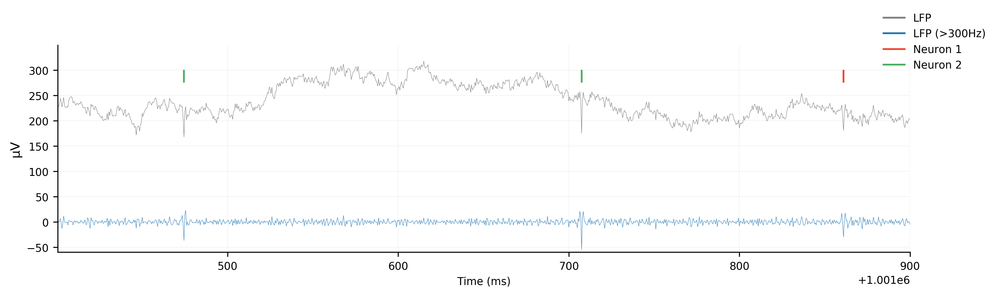

In [296]:
## Plot notch-filtered LFP before and after spike removal, and with a 300 Hz high pass 
# filter to pick out spikes.

chan = '3'
n_clus_by_chan = fr_df.groupby('chan').size().to_dict()
n_clusters = n_clus_by_chan[chan]

colors_ = ['C7', 'C0']
alphas = [1, 0.9]
markers = [None, None]
markersizes = [None, None]
markeredgewidths = [None, None]
legend_labels = ['LFP', 'LFP >300Hz']

lfp300 = mne.filter.filter_data(lfp_preproc.sel(channel=chan).copy().data.astype(np.float64), 
                                sfreq=2000, l_freq=300, h_freq=None)
dat = np.vstack((lfp_preproc.sel(channel=chan).copy().data, lfp300)) * 1e6

for clus in range(0, n_clusters):
    dat = np.vstack((dat, fr_df.query("(chan=='{}') & chan_clus=={}".format(chan, clus)).spikes.iat[0]))
    colors_.append(colors[clus+1])
    alphas.append(1)
    markers.append('|')
    markersizes.append(10)
    markeredgewidths.append(1.4)
    legend_labels.append('Neuron {}'.format(clus+1))
    
fig, ax = plot_trace(dat, start=1001400, duration=500, x_units='ms', 
                     colors=colors_, alphas=alphas, linewidths=[0.3, 0.3], 
                     markers=markers, markersizes=markersizes, 
                     markeredgewidths=markeredgewidths, figsize=(12, 3))
ax[0].set_ylabel('μV', fontsize=labelfontsize)

custom_lines = [Line2D([0], [0], color=colors_[0], linewidth=1.4, label='LFP'),
                Line2D([0], [0], color=colors_[1], linewidth=1.4, label='LFP (>300Hz)'),
                Line2D([0], [0], color=colors_[2], linewidth=1.4, label='Neuron 1'),
                Line2D([0], [0], color=colors_[3], linewidth=1.4, label='Neuron 2')]
legend = ax[0].legend(handles=custom_lines, loc=1, bbox_to_anchor=(1.1, 1.2))

#f = os.path.join(figure_dir, 'example_raw_LFP_trace_vs_300Hz_hipass_vs_spikes_{}_{}_ch{}.png'.format(subj, sess, chan))
#fig.savefig(f)

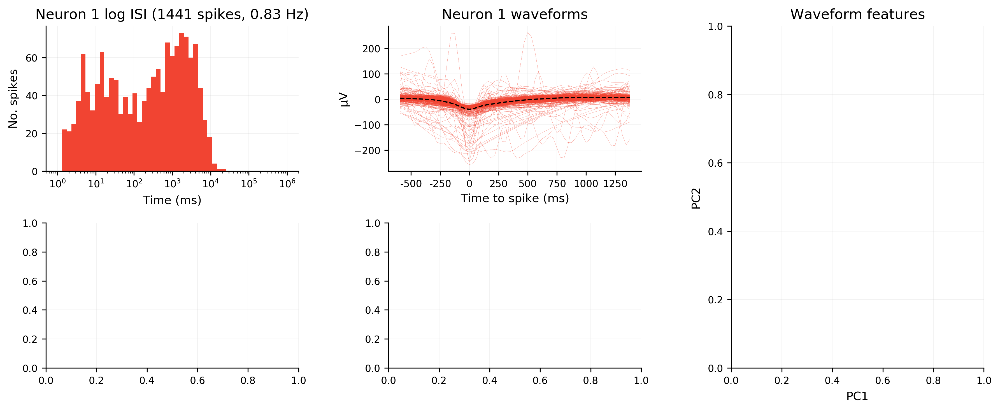

In [72]:
chan = '13' # 53

# Load the 32kHz wave_clus waveforms, then calculate firing rates and ISIs
units = np.array(fr_df.loc[fr_df.chan==chan].chan_clus.tolist()) + 1
subj, sess = subj_sess.split('_')
wave_clus = sio.loadmat('/data/continuous/{}/{}/cheetah/times_CSC{}.mat'.format(subj, sess, chan))
waveforms = {}
isis = {}
frs = {}
for unit in range(len(units)):
    waveforms[unit] = -wave_clus['spikes'][wave_clus['cluster_class'][:, 0]==unit+1, :]
    isis[unit] = np.diff(wave_clus['cluster_class'][wave_clus['cluster_class'][:, 0]==unit+1, 1])
    frs[unit] = 1000 / np.mean(isis[unit])

# Get principle components of the waveform features
pca = PCA()
spike_pcs = pca.fit_transform(wave_clus['inspk'])

# Plot results
fig, _ = plt.subplots(1, 3, figsize=(12, 5), dpi=300)
ax = []
ax.append(plt.subplot2grid((2, 3), (0, 0), fig=fig))
ax.append(plt.subplot2grid((2, 3), (0, 1), fig=fig))
ax.append(plt.subplot2grid((2, 3), (1, 0), fig=fig))
ax.append(plt.subplot2grid((2, 3), (1, 1), fig=fig))
ax.append(plt.subplot2grid((2, 3), (0, 2), rowspan=2, fig=fig))
tickfontsize = 10
labelfontsize = 10
figfontsize = 12

for i, unit in enumerate(waveforms.keys()):
    if i > 1:
        break
    ax[(2*i)].hist(isis[unit], bins=np.logspace(0, 6, num=50), color=colors[i+1])
    ax[(2*i)].set_xticks([1e0, 1e2, 1e4, 1e6])
    ax[(2*i)].set_xscale('log')
    ax[(2*i)].set_xlabel('Time (ms)', labelpad=5, fontsize=labelfontsize)
    ax[(2*i)].set_ylabel('No. spikes', labelpad=5, fontsize=labelfontsize)
    ax[(2*i)].set_title('Neuron {} log ISI ({} spikes, {:.2f} Hz)'.format(unit+1, len(waveforms[unit]), frs[unit]), fontsize=figfontsize)
    
    if len(waveforms[unit]) > 500:
        waveform_ints = np.linspace(0, len(waveforms[unit])-1, num=500, dtype=int)
    else:
        waveform_ints = np.arange(len(waveforms[unit]))
    for j in waveform_ints:
        ax[(2*i)+1].plot(waveforms[unit][j, :], linewidth=0.1, color=colors[i+1])
    ax[(2*i)+1].plot(np.mean(waveforms[unit], axis=0), linewidth=1, linestyle='--', color='k')
    ax[(2*i)+1].set_xticks(np.arange(0, 64, 8) + 3)
    ax[(2*i)+1].set_xticklabels([-500, -250, 0, 250, 500, 750, 1000, 1250])
    ax[(2*i)+1].set_xlabel('Time to spike (ms)', fontsize=labelfontsize)
    ax[(2*i)+1].set_ylabel('μV', fontsize=labelfontsize)
    ax[(2*i)+1].set_title('Neuron {} waveforms'.format(unit+1), fontsize=figfontsize)

i = 4
spike_params = {}

for j in range(1, len(np.unique(wave_clus['cluster_class'][:, 0]))):
    spike_params[j] = [spike_pcs[wave_clus['cluster_class'][:, 0]==j, 0],
                       spike_pcs[wave_clus['cluster_class'][:, 0]==j, 1]]
for j in spike_params.keys():
    sns.scatterplot(spike_params[j][0], spike_params[j][1], marker='+', size=1, alpha=0.6, legend=False, color=colors[j], ax=ax[i])
ax[i].set_xlabel('PC1', fontsize=labelfontsize, labelpad=5)
ax[i].set_ylabel('PC2', fontsize=labelfontsize, labelpad=5)
ax[i].set_title('Waveform features', fontsize=figfontsize)

fig.tight_layout(pad=1.08, w_pad=1.5, rect=[0, 0, 1, 1])

In [66]:
for key, val in isis.items():
    print('Unit {}: {} spikes, {} spikes < 3ms ({:.2f}%)'.format(key, len(val), np.sum(val<3), 100*np.sum(val<3)/len(val)))

Unit 0: 147 spikes, 3 spikes < 3ms (2.04%)


## Overlapping "spikes" across channels?

In [40]:
# Load spikes.
subj_sess = 'U370_env1'
wave_clus_dir = '/data/continuous/{}/{}/cheetah'.format(subj_sess.split('_')[0], subj_sess.split('_')[1])
wave_clus_file = 'CSC{}_spikes.mat'

spikes, fr_df, clus_to_chan, chan_to_clus = phase_locking.load_spikes(subj_sess)
units = fr_df.clus.tolist()

# Load the LFP.
sampling_rate = 2000
notch_freqs = [60, 120]
interp_spikes = False
lfp_raw, lfp_preproc = manning_analysis.process_lfp(subj_sess, 
                                                    subj_df=subj_df, 
                                                    sampling_rate=sampling_rate,
                                                    resampling_rate=0,
                                                    notch_freqs=notch_freqs,
                                                    interpolate=interp_spikes,
                                                    session_spikes=spikes)
del lfp_raw, spikes

In [55]:
print('{}: {} neurons'.format(subj_sess, len(fr_df)))
fr_df.groupby(['location', 'chan']).agg({'clus': len})

U370_env1: 31 neurons


clus
location chan      
LA       33       1
         34       1
         35       1
         36       1
         38       1
         39       1
         40       1
LEC      52       1
LOF      57       1
         58       1
         59       2
         60       1
         61       1
RA       1        1
         2        2
         4        1
         5        1
         7        1
         8        1
RAH      13       1
         14       1
REC      17       1
         18       1
         22       1
ROF      25       1
         26       1
         30       1
         31       1
         32       1

In [448]:
allspikes = np.array(fr_df.spikes.tolist())
allspikes[:, [0, 1, -2, -1]] = False
print(allspikes.shape)

(62, 2536279)


In [449]:
overlap = np.sum(allspikes, axis=0)
overlap += np.sum(np.roll(allspikes, shift=-1, axis=1), axis=0)
overlap += np.sum(np.roll(allspikes, shift=1, axis=1), axis=0)

m = np.zeros(allspikes.shape)
xvals, yvals = np.where(allspikes)
newvals = np.tile(overlap, len(m)).reshape(m.shape)
m[xvals, yvals] = newvals[xvals, yvals]

[ 0  1  2  3  4  5  6  7  8  9 10 12 14 15 22 26] [2216849  283572   30994    3920     605     161      82      57      29
       4       1       1       1       1       1       1]


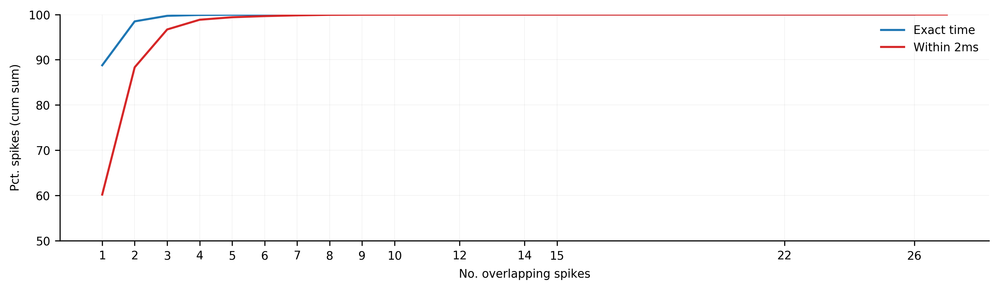

In [473]:
x, y = np.unique(np.sum(allspikes, axis=0), return_counts=True)
print(x, y)
x, y = x[1:], y[1:]
y = y / y.sum()

fig, ax = plt.subplots(1, 1, figsize=(12, 3), dpi=300)
x1, y1 = np.unique(np.sum(allspikes, axis=0), return_counts=True)
x2, y2 = np.unique(overlap, return_counts=True)
x3, y3 = np.unique(m, return_counts=True)

x1, y1 = x1[1:], y1[1:]
x2, y2 = x2[1:], y2[1:]
x3, y3 = x3[1:], y3[1:]

y1 = y1 / np.sum(y1)
y2 = y2 / np.sum(y2)
y3 = y3 / np.sum(y3)

ax.plot(x1, np.cumsum(y1), linewidth=1.5, label='Exact time')
#ax.plot(x2, np.cumsum(y2), linewidth=1.5, label='Within 2ms')
ax.plot(x3, np.cumsum(y3), linewidth=1.5, label='Within 2ms')
ax.set_xticks(x)
ax.set_ylim([.5, 1])
ax.set_yticks([.5, .6, .7, .8, .9, 1])
ax.set_yticklabels([50, 60, 70, 80, 90, 100])
ax.set_xlabel('No. overlapping spikes', labelpad=5)
ax.set_ylabel('Pct. spikes (cum sum)', labelpad=5)
ax.legend()

fig.show()

In [488]:
output = []
for i in range(len(allspikes)):
    v = m[i, :]
    output.append([len(v[v>1]) / len(v[v>0]), np.mean(v[v>0])])
output = np.array(output)

In [489]:
output.shape

(62, 2)

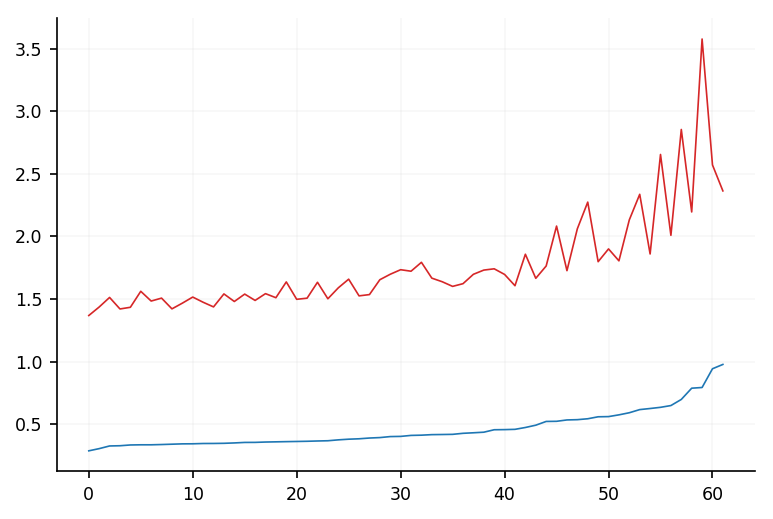

In [492]:
xsort = output[:, 0].argsort()
plt.plot(output[:, 0][xsort])
plt.plot(output[:, 1][xsort])

In [474]:
np.unique(allspikes, return_counts=True)

(array([False,  True]), array([156887495,    361803]))

In [472]:
np.unique(m, return_counts=True)

(array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 13.,
        14., 16., 22., 27.]),
 array([156887495,    217793,    101799,     30238,      7776,      2004,
              893,       612,       419,       138,        35,         4,
               13,        14,        16,        22,        27]))

In [425]:
np.sum(allspikes_, axis=0)

array([0, 0, 1, ..., 0, 0, 0])

In [423]:
np.unique(m[0, :], return_counts=True)

(array([False,  True]), array([2534389,    1890]))

In [ ]:
# Save each vector of spike train indices to a file.
#spike_train_dir = '/scratch/dscho/unit_activity_and_hpc_theta/data/lfp_plvs/spike_trains'
spike_train_dir = '/scratch/dscho/unit_activity_and_hpc_theta/data/crosselec_phase_locking/spike_inds'
sampling_rate = 2000
resampling_ratio = 1

for subj_sess in sorted(subj_df.subj_sess.unique()):
    _, fr_df, _, _ = phase_locking.load_spikes(subj_sess)
    units = fr_df.clus.tolist()
    spike_trains = np.array(fr_df.spikes.tolist())
    
#     # Remove spikes in the first or last 5 secs
#     spike_trains[:, :int(sampling_rate*5)] = False
#     spike_trains[:, -int(sampling_rate*5):] = False
    n_samples = np.round(spike_trains.shape[1] * resampling_ratio).astype(int)
    for i in range(len(units)):
        spike_inds_f = os.path.join(spike_train_dir, 'spike_inds-{}Hz-{}-unit{}.pkl'.format(int(sampling_rate), subj_sess, units[i]))
        spike_inds = np.where(spike_trains[i, :])[0]
        spike_inds = np.round(spike_inds * resampling_ratio).astype(int)
        dio.save_pickle([spike_inds, n_samples], spike_inds_f, verbose=False)

## Example cell

In [494]:
# U371_env1_10

# Load spikes.
subj_sess = 'U371_env1'
freqs = np.logspace(np.log10(0.5), np.log10(16), 16)

print(subj_sess)
spikes, fr_df, clus_to_chan, chan_to_clus = phase_locking.load_spikes(subj_sess)
units = fr_df.clus.tolist()

# Load the raw LFP.
lfp_raw, lfp_preproc = manning_analysis.process_lfp(subj_sess, 
                                                    subj_df=subj_df, 
                                                    sampling_rate=sampling_rate,
                                                    resampling_rate=0,
                                                    notch_freqs=notch_freqs,
                                                    interpolate=interp_spikes,
                                                    session_spikes=spikes)
del lfp_raw, spikes

U371_env1


In [528]:
local_lfp = lfp_preproc[24:32, :]
hpc_lfp = lfp_preproc[32:40, :]

In [542]:
fr_df.loc[fr_df.clus==10]

,subj_sess,chan,location,pct_interp,clus,chan_clus,mean_fr,fr,spikes,interp_mask
10,U371_env1,25,LEC,0.045165,10,2,1.4189,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[False, False, False, False, False, False, Fal...","[False, False, False, False, False, False, Fal..."


In [635]:
spike_train = fr_df.loc[fr_df.clus==10, 'spikes'].iat[0]
mean_fr = fr_df.loc[fr_df.clus==10, 'mean_fr'].iat[0]

In [529]:
# Get phase.
start_time = time()

hpc_phase = manning_analysis.run_morlet(hpc_lfp, 
                                        freqs=freqs, 
                                        width=morlet_width, 
                                        output=['phase'],
                                        savedir=False, 
                                        verbose=False)
hpc_phase = hpc_phase.squeeze().data

local_phase = manning_analysis.run_morlet(local_lfp, 
                                          freqs=freqs, 
                                          width=morlet_width, 
                                          output=['phase'],
                                          savedir=False, 
                                          verbose=False)
local_phase = local_phase.squeeze().data

print('Done in {:.2f} secs'.format(time() - start_time))

CPP total time wavelet loop:  51.96975874900818
CPP total time wavelet loop:  56.31057572364807
Done in 120.13 secs


In [532]:
local_lfp = lfp_preproc[24:32, :].data
hpc_lfp = lfp_preproc[32:40, :].data

In [533]:
local_pl = dio.open_pickle(
    os.path.join('/scratch/dscho/unit_activity_and_hpc_theta/data/crosselec_phase_locking/phase_locking/unit_to_region',
                 'phase_locking_stats-U371_env1-unit_10-lfp_LEC-500Hz-notch60_120Hz-nospikeinterp-5cycles-16log10freqs_0.5_to_16.0Hz.pkl'))
hpc_pl = dio.open_pickle(
    os.path.join('/scratch/dscho/unit_activity_and_hpc_theta/data/crosselec_phase_locking/phase_locking/unit_to_region',
                 'phase_locking_stats-U371_env1-unit_10-lfp_LAH-500Hz-notch60_120Hz-nospikeinterp-5cycles-16log10freqs_0.5_to_16.0Hz.pkl'))

In [536]:
len(spike_inds)

3280

In [601]:
freqs[hpc_pl.locked_freq_ind_z], 1000 * 1/freqs[hpc_pl.locked_freq_ind_z], freqs[local_pl.locked_freq_ind_z], 1000 * 1/freqs[local_pl.locked_freq_ind_z]

(2.519842099789747, 396.8502629920498, 5.039684199579493, 198.42513149602493)

In [557]:
n_timepoints = lfp_preproc.shape[-1]

In [558]:
n_samp

4000

In [566]:
hpc_lfp[j, 10000-n_samp:10000+n_samp].shape

(8000,)

In [602]:
len(local_lfp)

8

In [608]:
spike_inds = np.where(spike_train)[0]

dur = 1
n_samp = int(sampling_rate * dur)
spike_inds = spike_inds[(spike_inds>n_samp) & (spike_inds<(n_timepoints-n_samp-1))]
local_lfp_ = stats.zscore(local_lfp[0, :])
hpc_lfp_ = stats.zscore(hpc_lfp[-1, :])

# local_waves = []
# hpc_waves = []
# for i in spike_inds:
#     local_waves.append(local_lfp_[i-n_samp:i+n_samp+1])
#     hpc_waves.append(hpc_lfp_[i-n_samp:i+n_samp+1])
# local_waves = np.array(local_waves)
# hpc_waves = np.array(hpc_waves)

local_waves = []
hpc_waves = []
for j in range(len(local_lfp) - 1):
    for i in spike_inds:
        local_waves.append(local_lfp[j+1, i-n_samp:i+n_samp+1] * 1e6) # skipping the neuron's channel
for j in range(len(hpc_lfp)):
    for i in spike_inds:
        hpc_waves.append(hpc_lfp[j, i-n_samp:i+n_samp+1] * 1e6)
local_waves = np.array(local_waves)
hpc_waves = np.array(hpc_waves)

In [706]:
spike_inds = np.where(spike_train)[0]

dur = 1
n_samp = int(sampling_rate * dur)
spike_inds = spike_inds[(spike_inds>n_samp) & (spike_inds<(n_timepoints-n_samp-1))]
freq_ind = hpc_pl.locked_freq_ind_z

spike_phase_local = []
spike_phase_hpc = []
for j in range(len(local_lfp) - 1):
    for i in spike_inds:
        spike_phase_local.append(local_phase[freq_ind, j+1, i]) # skipping the neuron's channel
for j in range(len(hpc_lfp)):
    for i in spike_inds:
        spike_phase_hpc.append(hpc_phase[freq_ind, j, i])
        
spike_phase_local = np.array(spike_phase_local)
spike_phase_hpc = np.array(spike_phase_hpc)

local_bin_counts = []
for i in range(1, len(bins)):
    local_bin_counts.append(len(spike_phase_local[(spike_phase_local>=bins[i-1]) & (spike_phase_local<bins[i])]))
local_bin_counts = np.array(local_bin_counts) / len(spike_phase_local)

hpc_bin_counts = []
for i in range(1, len(bins)):
    hpc_bin_counts.append(len(spike_phase_hpc[(spike_phase_hpc>=bins[i-1]) & (spike_phase_hpc<bins[i])]))
hpc_bin_counts = np.array(hpc_bin_counts) / len(spike_phase_hpc)

In [724]:
stats.zscore(hpc_pl.bs_mrls, axis=1).shape

(16, 5000)

In [729]:
np.max(stats.zscore(hpc_pl.bs_mrls, axis=1), axis=0).shape

(5000,)

In [744]:
local_bs_mrls_z = stats.zscore(local_pl.bs_mrls, axis=1)[freq_ind, :]
local_obs_z = local_pl.mrls_z[freq_ind]

hpc_bs_mrls_z = np.max(stats.zscore(hpc_pl.bs_mrls, axis=1), axis=0)
hpc_obs_z = hpc_pl.mrls_z[freq_ind]

bins = np.linspace(min(local_bs_mrls_z), max(local_bs_mrls_z), num=21)
local_bs_bins = []
for i in range(1, len(bins)):
    local_bs_bins.append(len(local_bs_mrls_z[(local_bs_mrls_z>=bins[i-1]) & (local_bs_mrls_z<bins[i])]))
local_bs_bins = np.array(local_bs_bins)
local_bs_bins_x = np.mean(tuple(zip(bins[0:-1], bins[1:])), axis=1)

bins = np.linspace(min(hpc_bs_mrls_z), max(hpc_bs_mrls_z), num=21)
hpc_bs_bins = []
for i in range(1, len(bins)):
    hpc_bs_bins.append(len(hpc_bs_mrls_z[(hpc_bs_mrls_z>=bins[i-1]) & (hpc_bs_mrls_z<bins[i])]))
hpc_bs_bins = np.array(hpc_bs_bins)
hpc_bs_bins_x = np.mean(tuple(zip(bins[0:-1], bins[1:])), axis=1)

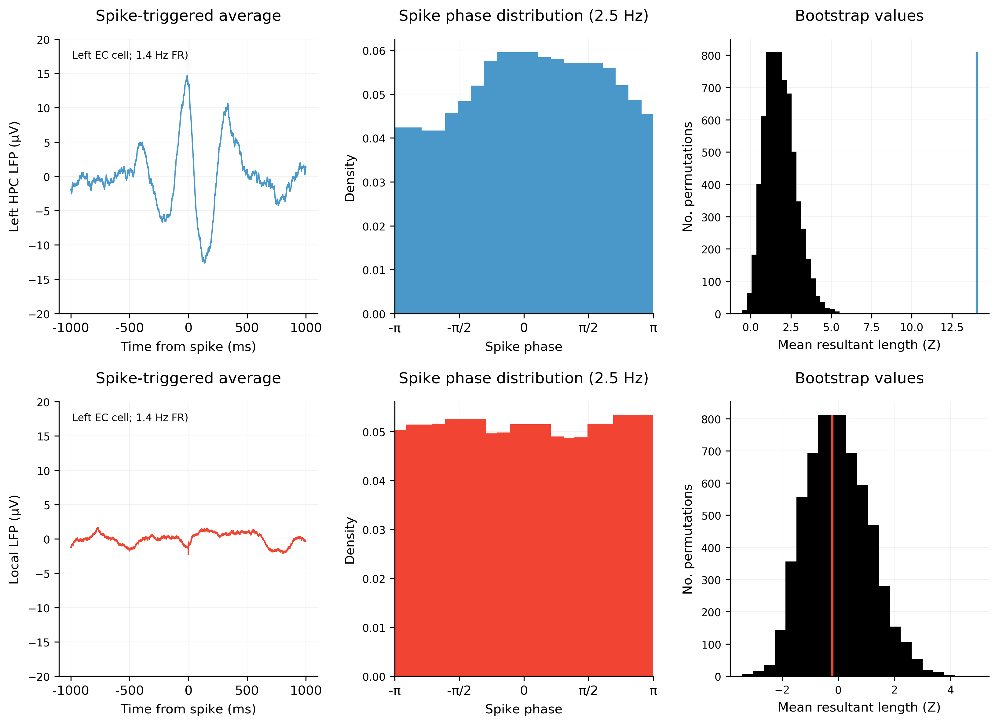

In [756]:
fig, ax = plt.subplots(2, 3, figsize=(11, 8), dpi=300)
ax = np.ravel(ax)

tickfontsize = 10
labelfontsize = 10
figfontsize = 12

means = {'local': np.mean(local_waves - np.mean(local_waves), axis=0),
         'hpc': np.mean(hpc_waves - np.mean(hpc_waves), axis=0)}

i = 0
ax[i].plot(np.arange((2*n_samp) + 1), means['hpc'], color=colors[0], linewidth=1)
ax[i].set_xticks([0, 1000, 2000, 3000, 4000])
ax[i].set_xticklabels([-1000, -500, 0, 500, 1000], fontsize=tickfontsize)
ax[i].set_xlabel('Time from spike (ms)', fontsize=labelfontsize, labelpad=5)
ax[i].set_ylim([-20, 20])
ax[i].set_ylabel('Left HPC LFP (μV)', fontsize=labelfontsize, labelpad=5)
ax[i].set_title('Spike-triggered average', fontsize=figfontsize, y=1.04)
ax[i].text(0.05, 0.93, 'Left EC cell; {:.1f} Hz FR)'.format(mean_fr), fontsize=labelfontsize-2, transform=ax[i].transAxes)

i = 1
bins = np.linspace(-np.pi, np.pi, num=21)
ax[i].bar(np.mean(tuple(zip(bins[0:-1], bins[1:])), axis=1), hpc_bin_counts, width=1, color=colors[0])
ax[i].set_xlim([-np.pi, np.pi])
ax[i].set_xticks([-np.pi, -np.pi/2, 0, np.pi/2, np.pi])
ax[i].set_xticklabels(['-π', '-π/2', '0', 'π/2', 'π'], fontsize=labelfontsize)
ax[i].set_xlabel('Spike phase', fontsize=labelfontsize, labelpad=5)
ax[i].set_title('Spike phase distribution ({:.1f} Hz)'.format(freqs[freq_ind]), fontsize=figfontsize, y=1.04)
ax[i].set_ylabel('Density', fontsize=labelfontsize, labelpad=5)

i = 2
ax[i].bar(hpc_bs_bins_x, hpc_bs_bins, width=1, color='k')
ax[i].vlines(hpc_obs_z, 0, max(hpc_bs_bins), linewidth=2, color=colors[0])
ax[i].set_xlabel('Mean resultant length (Z)', fontsize=labelfontsize, labelpad=5)
ax[i].set_ylabel('No. permutations', fontsize=labelfontsize, labelpad=5)
ax[i].set_title('Bootstrap values', fontsize=figfontsize, y=1.04)

i = 3
ax[i].plot(np.arange((2*n_samp) + 1), means['local'], color=colors[1], linewidth=1)
ax[i].set_xticks([0, 1000, 2000, 3000, 4000])
ax[i].set_xticklabels([-1000, -500, 0, 500, 1000], fontsize=tickfontsize)
ax[i].set_xlabel('Time from spike (ms)', fontsize=labelfontsize, labelpad=5)
ax[i].set_ylim([-20, 20])
ax[i].set_ylabel('Local LFP (μV)', fontsize=labelfontsize, labelpad=5)
ax[i].set_title('Spike-triggered average', fontsize=figfontsize, y=1.04)
ax[i].text(0.05, 0.93, 'Left EC cell; {:.1f} Hz FR)'.format(mean_fr), fontsize=labelfontsize-2, transform=ax[i].transAxes)

i = 4
bins = np.linspace(-np.pi, np.pi, num=21)
ax[i].bar(np.mean(tuple(zip(bins[0:-1], bins[1:])), axis=1), local_bin_counts, width=1, color=colors[1])
ax[i].set_xlim([-np.pi, np.pi])
ax[i].set_xticks([-np.pi, -np.pi/2, 0, np.pi/2, np.pi])
ax[i].set_xticklabels(['-π', '-π/2', '0', 'π/2', 'π'], fontsize=labelfontsize)
ax[i].set_xlabel('Spike phase', fontsize=labelfontsize, labelpad=5)
ax[i].set_title('Spike phase distribution ({:.1f} Hz)'.format(freqs[freq_ind]), fontsize=figfontsize, y=1.04)
ax[i].set_ylabel('Density', fontsize=labelfontsize, labelpad=5)

i = 5
ax[i].bar(local_bs_bins_x, local_bs_bins, width=1, color='k')
ax[i].vlines(local_obs_z, 0, max(local_bs_bins), linewidth=2, color=colors[1])
ax[i].set_xlabel('Mean resultant length (Z)', fontsize=labelfontsize, labelpad=5)
ax[i].set_ylabel('No. permutations', fontsize=labelfontsize, labelpad=5)
ax[i].set_title('Bootstrap values', fontsize=figfontsize, y=1.04)

fig.tight_layout(pad=1.08, h_pad=1.5, w_pad=1.5, rect=[0, 0, 1, 1])

## Re-spike sorted data

In [432]:
import neuralynx_io
import warnings

In [433]:
# Find WaveClus output files for a session.
subj_sess = 'U370_env1'

subj, sess = subj_sess.split('_')
#spike_dir = '/scratch/dscho/unit_activity_and_hpc_theta/data/spikes/wave_clus_3'
#fname = os.path.join(spike_dir, subj, sess, 'times_CSC{}.mat')
#wc_files = glob(os.path.join(spike_dir, subj, sess, 'times*.mat'))
spike_dir = '/data/continuous'
fname = os.path.join(spike_dir, subj, sess, 'cheetah', 'times_CSC{}.mat')
wc_files = glob(os.path.join(spike_dir, subj, sess, 'cheetah', 'times*.mat'))
print('Found {} files'.format(len(wc_files)))

Found 64 files


In [434]:
chan = '2'
dsamp_spike_dir = '/data3/scratch/dscho/frLfp/data/raw/'
dsamp_fname = os.path.join(dsamp_spike_dir, subj, sess, '{}-{}-{}.mat')
dat = sio.loadmat(dsamp_fname.format(subj, sess, chan))

In [435]:
# Get WaveClus output for each channel in the session.
spike_dir = '/data/continuous'
fname = os.path.join(spike_dir, subj, sess, 'cheetah', 'times_CSC{}.mat')

wave_clus = OrderedDict()
unit_chans = []
n_units = 0

for chan in range(1, len(wc_files)+1):
    chan = str(chan)
    dat = sio.loadmat(fname.format(chan))
    wave_clus[str(chan)] = dat
    units = [x for x in np.unique(wave_clus[chan]['cluster_class'][:, 0]) if x != 0]
    if len(units) > 0:
        unit_chans.append(chan)
        n_units += len(units)
        
print('{} units from {}/{} channels'.format(n_units, len(unit_chans), len(wave_clus)))

31 units from 29/64 channels


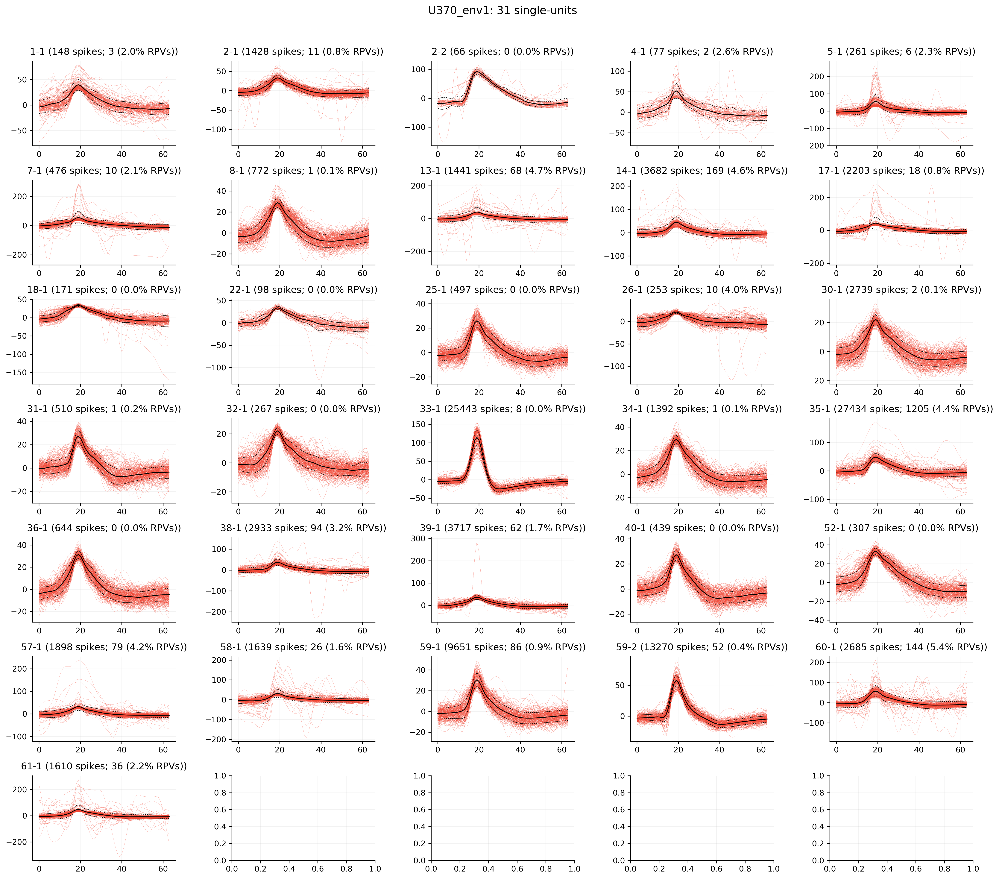

In [436]:
# Plot WaveClus waveforms for all single-units.
fig, ax = plt.subplots(int(np.ceil(n_units/5)), 5, figsize=(18, 15), dpi=300)
ax = np.ravel(ax)

max_spikes = 200
i = 0
for chan in wave_clus.keys():
    units = [int(x) for x in np.unique(wave_clus[chan]['cluster_class'][:, 0]) if x != 0]
    for unit in units:
        ma = wave_clus[chan]['cluster_class'][:, 0]==unit
        n_spikes = ma.sum()
        waves = wave_clus[chan]['spikes'][ma, :]
        isis = np.diff(wave_clus[chan]['cluster_class'][ma, 1])
        n_rpvs = np.sum(isis<3)
        if n_spikes > max_spikes:
            inds = np.linspace(0, n_spikes-1, num=max_spikes, dtype=int)
        else:
            inds = np.arange(n_spikes)

        
        for ind in inds:
            ax[i].plot(waves[ind, :], linewidth=0.1, color=colors[1])
        mean_wave = np.mean(waves, axis=0)
        std_wave = np.std(waves, axis=0)
        ax[i].plot(mean_wave, linewidth=1, linestyle='-', color='k')
        ax[i].plot(mean_wave + std_wave, linewidth=0.5, linestyle='--', color='k')
        ax[i].plot(mean_wave - std_wave, linewidth=0.5, linestyle='--', color='k')
        ax[i].set_title('{}-{} ({} spikes; {} ({:.1f}% RPVs))'.format(chan, int(unit), n_spikes, n_rpvs, 100*n_rpvs/n_spikes), 
                        fontsize=12, y=1.02)
        i += 1

fig.suptitle('{}: {} single-units'.format(subj_sess, n_units), fontsize=14, y=1.04)
fig.tight_layout(h_pad=1.05)
#plt.savefig(os.path.join(spike_dir, subj, sess, '{}_single_unit_waveforms.pdf'.format(subj_sess)))

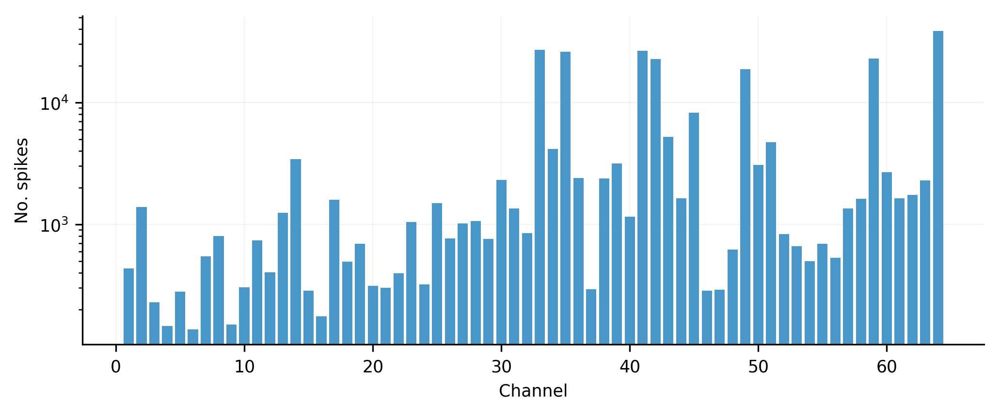

In [185]:
# Get the number of spikes for each channel (across all single- and multi-unit clusters)
spikes_by_chan = np.array([[int(x), len(wave_clus[x]['cluster_class'])] for x in wave_clus.keys()]).T

fig, ax = plt.subplots(1, 1, figsize=(8, 3), dpi=300)

ax.bar(spikes_by_chan[0, :], spikes_by_chan[1, :], color=colors[0])
ax.set_xlabel('Channel')
ax.set_ylabel('No. spikes')
ax.set_yscale('log')

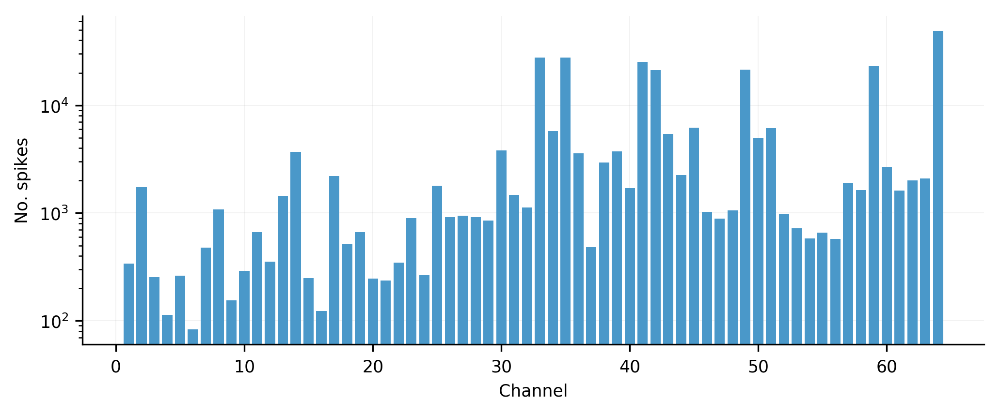

In [182]:
# Get the number of spikes for each channel (across all single- and multi-unit clusters)
spikes_by_chan_old = np.array([[int(x), len(wave_clus[x]['cluster_class'])] for x in wave_clus.keys()]).T

fig, ax = plt.subplots(1, 1, figsize=(8, 3), dpi=300)

ax.bar(spikes_by_chan_old[0, :], spikes_by_chan_old[1, :], color=colors[0])
ax.set_xlabel('Channel')
ax.set_ylabel('No. spikes')
ax.set_yscale('log')

(0.989980558341565, 1.9892596562948466e-54)


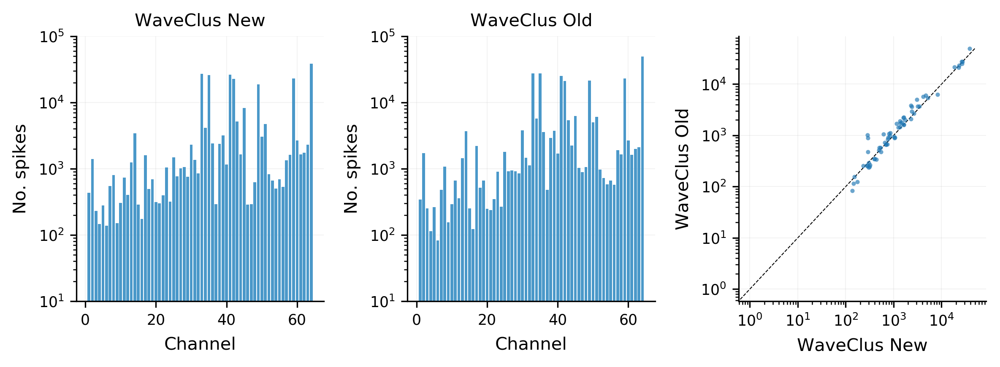

In [206]:
fig, ax = plt.subplots(1, 3, figsize=(8, 3), dpi=300)
ax = np.ravel(ax)
labelfontsize = 10
figfontsize = 10

i = 0
ax[i].bar(spikes_by_chan[0, :], spikes_by_chan[1, :], color=colors[0])
ax[i].set_title('WaveClus New', fontsize=figfontsize, y=1)

i = 1
ax[i].bar(spikes_by_chan_old[0, :], spikes_by_chan_old[1, :], color=colors[0])
ax[i].set_title('WaveClus Old', fontsize=figfontsize, y=1)

for i in range(2):
    ax[i].set_xlabel('Channel', fontsize=labelfontsize, labelpad=5)
    ax[i].set_ylabel('No. spikes', fontsize=labelfontsize, labelpad=5)
    ax[i].set_yscale('log')
    ax[i].set_ylim([1e1, 1e5])

i = 2
print(stats.pearsonr(spikes_by_chan[1, :], spikes_by_chan_old[1, :]))
sns.scatterplot(spikes_by_chan[1, :], spikes_by_chan_old[1, :], ax=ax[i],
                linewidth=0, alpha=0.66, s=6)
ax[i].plot(np.arange(5e4), np.arange(5e4),
        linestyle='--', linewidth=0.5, color='k', zorder=0)
ax[i].set_xscale('log')
ax[i].set_yscale('log')
ax[i].set_xlabel('WaveClus New', fontsize=labelfontsize, labelpad=5)
ax[i].set_ylabel('WaveClus Old', fontsize=labelfontsize, labelpad=5)

fig.tight_layout(w_pad=1.05)

In [253]:
# Get the number of samples in the 2000 Hz downsampled LFP and 
# the recording start and stop times (in ms) for the Neuralynx LFP
warnings.filterwarnings('ignore')

df = subj_df.query("(subj_sess=='{}')".format(subj_sess))
assert len(np.unique([len(np.fromfile(df.raw_lfp_file.tolist()[i], dtype='float32')) for i in range(len(df))])) == 1
n_dsamp = len(np.fromfile(df.raw_lfp_file.tolist()[0], dtype='float32'))

ncs_files = glob(os.path.join('/data/continuous', subj, sess, 'cheetah', 'CSC*.Ncs'))
ch_start = neuralynx_io.load_ncs(ncs_files[0])['time'][0]# / 1000
ch_stop = neuralynx_io.load_ncs(ncs_files[0])['time'][-1]# / 1000

warnings.filterwarnings('default')

In [280]:
# For each single and multi-unit, convert WaveClus spike times
# to 2000 and 500 Hz downsampled times
all_spike_inds = OrderedDict()
for chan in wave_clus.keys():
    units = [int(x) for x in np.unique(wave_clus[chan]['cluster_class'][:, 0]) if x != 0]
    for unit in units:
        ma = wave_clus[chan]['cluster_class'][:, 0]==unit
        spike_inds = wave_clus[chan]['cluster_class'][ma, 1] * 1e3
        spike_pcts = (spike_inds - ch_start) / (ch_stop - ch_start)
        spike_pcts = (spike_inds) / (ch_stop - ch_start) # + (2 * ch_start/1e3)
        #spike_pcts = (spike_inds+ch_start) / (ch_stop - ch_start)
        if len(spike_pcts[(spike_pcts<0) | (spike_pcts>1)]):
            print('{}_{} {}/{} spikes out of session'.format(chan, unit-1, len(spike_pcts[(spike_pcts<0) | (spike_pcts>1)]), len(spike_pcts)))
        #spike_pcts = spike_pcts[(spike_pcts>0) & (spike_pcts<1)]
        spike_inds_dsamp = np.round(spike_pcts * n_dsamp).astype(int)
        all_spike_inds['{}_{}'.format(chan, unit-1)] = spike_inds_dsamp

35_0 1/27434 spikes out of session
59_0 1/9651 spikes out of session


In [226]:
all_spike_inds.keys()

odict_keys(['1_0', '2_0', '2_1', '4_0', '5_0', '7_0', '8_0', '13_0', '14_0', '17_0', '18_0', '22_0', '25_0', '26_0', '30_0', '31_0', '32_0', '33_0', '34_0', '35_0', '36_0', '38_0', '39_0', '40_0', '52_0', '57_0', '58_0', '59_0', '59_1', '60_0', '61_0'])

In [296]:
chan = '2'
unit = 0

spike_inds = all_spike_inds['{}_{}'.format(chan, unit)]
target = np.where(fr_df.query("(chan=='{}') & (chan_clus=={})".format(chan, unit)).spikes.iat[0])[0]

In [297]:
spike_inds, target, spike_inds - target

(array([    486,     724,     870, ..., 3474117, 3474460, 3476810]),
 array([    487,     725,     871, ..., 3474079, 3474422, 3476772]),
 array([-1, -1, -1, ..., 38, 38, 38]))

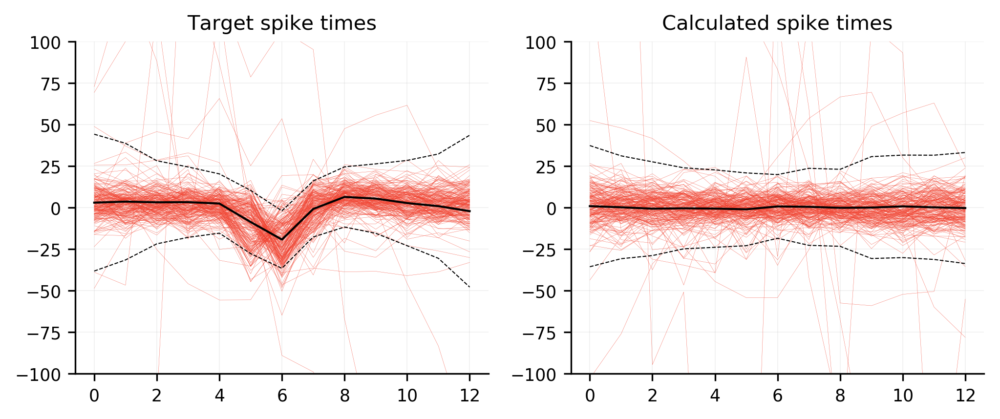

In [302]:
fig, ax = plt.subplots(1, 2, figsize=(8, 3), dpi=300)
ax = np.ravel(ax)
max_spikes = 200

i = 0
waves = []
for ind in target[(target>6) & (target<n_dsamp-7)]:
    waves.append(1e6 * (lfp_preproc[int(chan)-1, ind-6:ind+7] - np.mean(lfp_preproc[int(chan)-1, ind-6:ind+7])))
waves = np.array(waves)

n_spikes = len(target)
if n_spikes > max_spikes:
    inds = np.linspace(0, n_spikes-1, num=max_spikes, dtype=int)
else:
    inds = np.arange(n_spikes)      
for ind in inds:
    ax[i].plot(waves[ind, :], linewidth=0.1, color=colors[1])
mean_wave = np.mean(waves, axis=0)
std_wave = np.std(waves, axis=0)
ax[i].plot(mean_wave, linewidth=1, linestyle='-', color='k')
ax[i].plot(mean_wave + std_wave, linewidth=0.5, linestyle='--', color='k')
ax[i].plot(mean_wave - std_wave, linewidth=0.5, linestyle='--', color='k')
ax[i].set_title('Target spike times', fontsize=figfontsize, y=1)

i = 1
waves = []
for ind in spike_inds[(spike_inds>6) & (spike_inds<n_dsamp-7)]:
    waves.append(1e6 * (lfp_preproc[int(chan)-1, ind-6:ind+7] - np.mean(lfp_preproc[int(chan)-1, ind-6:ind+7])))
waves = np.array(waves)

n_spikes = len(spike_inds)
if n_spikes > max_spikes:
    inds = np.linspace(0, n_spikes-1, num=max_spikes, dtype=int)
else:
    inds = np.arange(n_spikes)      
for ind in inds:
    ax[i].plot(waves[ind, :], linewidth=0.1, color=colors[1])
mean_wave = np.mean(waves, axis=0)
std_wave = np.std(waves, axis=0)
ax[i].plot(mean_wave, linewidth=1, linestyle='-', color='k')
ax[i].plot(mean_wave + std_wave, linewidth=0.5, linestyle='--', color='k')
ax[i].plot(mean_wave - std_wave, linewidth=0.5, linestyle='--', color='k')
ax[i].set_title('Calculated spike times', fontsize=figfontsize, y=1)

for i in range(2):
    ax[i].set_ylim([-100, 100])

In [299]:
len(spike_inds), len(spike_inds[(spike_inds>6) & (spike_inds<n_dsamp-7)])

(1428, 1428)

In [300]:
len(spike_inds), len(target)

(1428, 1428)

In [134]:
spikes, fr_df, clus_to_chan, chan_to_clus = phase_locking.load_spikes(subj_sess)

# Load the raw LFP.
sampling_rate=2000
notch_freqs=[60, 120]
interp_spikes = False
lfp_raw, lfp_preproc = manning_analysis.process_lfp(subj_sess, 
                                                    subj_df=subj_df, 
                                                    sampling_rate=sampling_rate,
                                                    resampling_rate=0,
                                                    notch_freqs=notch_freqs,
                                                    interpolate=interp_spikes,
                                                    session_spikes=spikes)
del lfp_raw, spikes

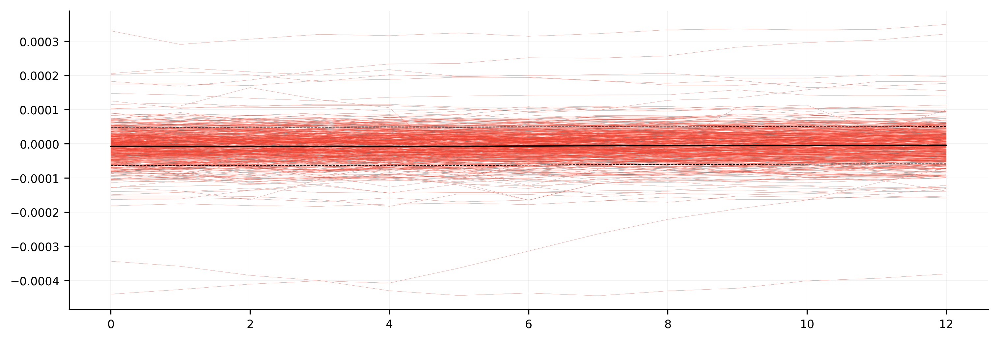

In [154]:
j = 1

win = 6
chan_units = list(all_spike_inds.keys())
chan, unit = chan_units[j].split('_')
dat = lfp_preproc.data[int(chan)-1, :]
spike_inds = all_spike_inds[chan_units[j]]
spike_inds = spike_inds[(spike_inds>win) & (spike_inds<(len(dat)-win-1))]

waves = []
for i, spike_ind in enumerate(spike_inds):
    waves.append(dat[spike_ind-win:spike_ind+win+1])
waves = np.array(waves)

# Plot
fig, ax = plt.subplots(1, 1, figsize=(12, 4), dpi=300)

max_spikes = 500
n_spikes = len(spike_inds)
if n_spikes > max_spikes:
    inds = np.linspace(0, n_spikes-1, num=max_spikes, dtype=int)
else:
    inds = np.arange(n_spikes)
            
for ind in inds:
    ax.plot(waves[ind, :], linewidth=0.1, color=colors[1])
mean_wave = np.mean(waves, axis=0)
std_wave = np.std(waves, axis=0)
ax.plot(mean_wave, linewidth=1, linestyle='-', color='k')
ax.plot(mean_wave + std_wave, linewidth=0.5, linestyle='--', color='k')
ax.plot(mean_wave - std_wave, linewidth=0.5, linestyle='--', color='k')

In [853]:
# Get session info.
subj_df = phase_locking.get_subj_df()
subj_df.insert(4, 'chan_ind', subj_df.chan.apply(lambda x: int(x)-1))

sessions1 = ['U387_ses3', 'U369_env1', 'U372_ses2', 'U390_ses3', 
             'U369_env2', 'U373_ses1', 'U387_ses1', 'U380_ses2',
             'U393_ses2', 'U395_ses2', 'U384_ses3', 'U385_ses4', 
             'U371_env2', 'U371_env3']

sessions2 = [sub for sub in subj_df.subj_sess.unique().tolist() 
             if sub not in (sessions1 + ['U367_env2', 'U386_ses1', 'U386_ses2'])]

sessions_all = sessions1 + sessions2

print('sessions1: {} \nsessions2: {} \nsessions_all: {} \nsessions_available: {}'
      .format(len(sessions1), len(sessions2), len(sessions_all), len(subj_df.subj_sess.unique())))

sessions1: 14 
sessions2: 29 
sessions_all: 43 
sessions_available: 46


In [932]:
# Gather all single- and multi-unit spike times from 2000Hz LFP-aligned
# WaveClus .mat files
start_time = time()

save_output = False
wave_clus_dir = '/data3/scratch/dscho/frLfp/data/ucla'
cols = ['subj_sess', 'roi', 'chan', 'chan_unit', 'n_spikes', 'is_mua', 'spike_inds']
waveclus_dat = []
missing_chans = []
no_spikes = []
for subj_sess in np.sort(sessions_all): 
    subj, sess = subj_sess.split('_')
    for iChan in range(64):
        chan = str(iChan+1)
        f = os.path.join(wave_clus_dir, subj, sess, '{}-{}-{}.mat'.format(subj, sess, chan))
        if os.path.exists(f):
            dat = sio.loadmat(f)
            if (len(dat['unitNames']) > 0) & (len(dat['anatlabel']) > 0):
                n_units = len(dat['unitNames'][0])
                roi = dat['anatlabel'][0]
                for iUnit in range(n_units):
                    try:
                        n_spikes = len(np.squeeze(dat['spikeTimes'][0][iUnit]))
                    except TypeError:
                        n_spikes = 0
                    if n_spikes > 0:
                        if dat['unitNames'][0][iUnit][0][-1] == '0':
                            is_mua = True
                        else:
                            is_mua = False
                        spike_inds = list(np.squeeze(dat['spikeTimes'][0][iUnit]))
                        waveclus_dat.append([subj_sess, roi, chan, iUnit, n_spikes, is_mua, spike_inds])
            else:
                no_spikes.append('{}_{}'.format(subj_sess, chan))
        else:
            missing_chans.append('{}_{}'.format(subj_sess, chan))

waveclus_dat = pd.DataFrame(waveclus_dat, columns=cols)
print('{} units, {} channels with no spikes, {} missing channels\n'.format(len(waveclus_dat), len(no_spikes), len(missing_chans)))
if save_output:
    dio.save_pickle(waveclus_dat, os.path.join(wave_clus_dir, 'waveclus_dat.pkl'))
    
print('Done in {:.2f} secs'.format(time() - start_time))

4352 units, 133 channels with no spikes, 0 missing channels

Done in 19.62 secs


In [1002]:
# Save MUA spike times (i.e. combined spike times for single- and multi-units)
# for each channel, at 2000 Hz and 500 Hz.
start_time = time()

spike_inds_dir = '/scratch/dscho/unit_activity_and_hpc_theta/data/crosselec_phase_locking/spike_inds_mua'
resampling_ratio = 0.25
for index, grp in waveclus_dat.groupby(['subj_sess', 'chan']):
    subj_sess, chan = index
    
    # Loop over all units for the channel and create a list of all spike times.
    spike_inds = []
    n_units = len(grp)
    for iUnit in range(n_units):
        spike_inds += grp.iat[iUnit, -1] # -1 is the spike_inds column
    spike_inds_2000 = np.unique(spike_inds)
    spike_inds_500 = np.round(spike_inds_2000 * resampling_ratio).astype(int)
    
    spike_inds_2000_f = os.path.join(spike_inds_dir, 'mua_spike_inds-2000Hz-{}-iChan{}.pkl'.format(subj_sess, int(chan)-1))
    spike_inds_500_f = os.path.join(spike_inds_dir, 'mua_spike_inds-500Hz-{}-iChan{}.pkl'.format(subj_sess, int(chan)-1))
    dio.save_pickle(spike_inds_2000, spike_inds_2000_f, verbose=False)
    dio.save_pickle(spike_inds_500, spike_inds_500_f, verbose=False)
    
print('Done in {:.2f} secs'.format(time() - start_time))

Done in 43.97 secs


In [1008]:
lfp_mua_f = os.path.join(mua_dir, 'mua_spike_inds-{}Hz-{}-iChan{}.pkl'.format(sampling_rate, subj_sess, iChan))
if os.path.exists(lfp_mua_f):
    mua_spike_inds = dio.open_pickle(lfp_mua_f)
else:
    print('Missing file')

In [8]:
subj_sess = 'U370_env1'
unit = 1
iChan = 1

u2r_file = '{}_unit_to_lfp-region_pairs_df.pkl'.format(subj_sess)
u2r_path = os.path.join('/scratch/dscho/unit_activity_and_hpc_theta/data/crosselec_phase_locking/metadata', u2r_file)
u2r_df = dio.open_pickle(u2r_path)
info = u2r_df.iloc[0]

In [18]:
from phase_locking import shift_spike_inds

In [168]:
spike_inds, n_timepoints = dio.open_pickle(os.path.join(input_dir, 'spike_inds', 'spike_inds-{}Hz-{}-unit{}.pkl'
                                                        .format(sampling_rate, subj_sess, unit)))


NameError: name 'pl_df' is not defined

In [249]:
u2r_df.head(10)

,subj_sess,subj_sess_unit,unit,unit_chan_ind,unit_hemroi,unit_hem,unit_roi,unit_is_hpc,unit_nspikes,unit_fr,lfp_hemroi,lfp_hem,lfp_roi,lfp_is_hpc,same_chan,same_hemroi,same_hem,same_roi,both_hpc,unit_hemroi2,lfp_hemroi2,unit_roi2,lfp_roi2,same_roi2,lfp_chan_inds,edge
0,U370_env1,U370_env1_1,1,1,RA,R,A,0,1428,0.821264,LA,L,A,0,0,0,0,1,0,ramy,lamy,amy,amy,True,"[32, 33, 34, 35, 36, 37, 38, 39]",ctx-ctx
1,U370_env1,U370_env1_1,1,1,RA,R,A,0,1428,0.821264,LAH,L,AH,1,0,0,0,0,0,ramy,lhpc,amy,hpc,False,"[40, 41, 42, 43, 44, 45, 46, 47]",ctx-hpc
2,U370_env1,U370_env1_1,1,1,RA,R,A,0,1428,0.821264,LEC,L,EC,0,0,0,0,0,0,ramy,lec,amy,ec,False,"[48, 49, 50, 51, 52, 53, 54, 55]",ctx-ctx
3,U370_env1,U370_env1_1,1,1,RA,R,A,0,1428,0.821264,LOF,L,OF,0,0,0,0,0,0,ramy,lofc,amy,ofc,False,"[56, 57, 58, 59, 60, 61, 62, 63]",ctx-ctx
4,U370_env1,U370_env1_1,1,1,RA,R,A,0,1428,0.821264,RA,R,A,0,0,1,1,1,0,ramy,ramy,amy,amy,True,"[0, 2, 3, 4, 5, 6, 7]",ctx-local
5,U370_env1,U370_env1_1,1,1,RA,R,A,0,1428,0.821264,RAH,R,AH,1,0,0,1,0,0,ramy,rhpc,amy,hpc,False,"[8, 9, 10, 11, 12, 13, 14, 15]",ctx-hpc
6,U370_env1,U370_env1_1,1,1,RA,R,A,0,1428,0.821264,REC,R,EC,0,0,0,1,0,0,ramy,rec,amy,ec,False,"[16, 17, 18, 19, 20, 21, 22, 23]",ctx-ctx
7,U370_env1,U370_env1_1,1,1,RA,R,A,0,1428,0.821264,ROF,R,OF,0,0,0,1,0,0,ramy,rofc,amy,ofc,False,"[24, 25, 26, 27, 28, 29, 30, 31]",ctx-ctx
8,U370_env1,U370_env1_12,12,24,ROF,R,OF,0,497,0.285832,LA,L,A,0,0,0,0,0,0,rofc,lamy,ofc,amy,False,"[32, 33, 34, 35, 36, 37, 38, 39]",ctx-ctx
9,U370_env1,U370_env1_12,12,24,ROF,R,OF,0,497,0.285832,LAH,L,AH,1,0,0,0,0,0,rofc,lhpc,ofc,hpc,False,"[40, 41, 42, 43, 44, 45, 46, 47]",ctx-hpc


In [351]:
freqs = np.logspace(np.log10(0.5), np.log10(128), 17)

array([  0,   1,   2,   4,   8,  16,  32,  64, 128])

In [967]:
cospike_steps = 1

mua_spike_inds_ = dio.open_pickle(lfp_mua_f)
mua_spike_inds = np.array([])
for offset in range(-cospike_steps, cospike_steps+1):
    mua_spike_inds = np.append(mua_spike_inds, mua_spike_inds_ + offset)
mua_spike_inds = np.unique(mua_spike_inds).astype(int)

mua_spike_inds_, mua_spike_inds

(array([    36,     70,    115, ..., 634003, 634022, 634024]),
 array([    35,     36,     37, ..., 634023, 634024, 634025]))

In [424]:
start_time = time()

subj_sess = 'U369_env1'

u2r_file = '{}_unit_to_lfp-region_pairs_df.pkl'.format(subj_sess)
u2r_path = os.path.join('/scratch/dscho/unit_activity_and_hpc_theta/data/crosselec_phase_locking/metadata', u2r_file)
u2r_df = dio.open_pickle(u2r_path)
info = u2r_df.iloc[87].copy()

n_freqs=17
sampling_rate=500
time_win=2
n_bootstraps=1000
remove_cospikes=True
cospike_steps = 1
save_outputs=True
input_dir='/scratch/dscho/unit_activity_and_hpc_theta/data/crosselec_phase_locking'
phase_dir = '/scratch/dscho/unit_activity_and_hpc_theta/data/crosselec_phase_locking/wavelet_phase_bband'
phase_fname='phase-{}-iChan{}-iFreq{}-{}Hz-notch60_120Hz-nospikeinterp-5cycles-17log10freqs_0.5_to_128.0Hz.pkl'
output_dir = '/scratch/dscho/unit_activity_and_hpc_theta/data/crosselec_phase_locking/phase_locking/unit_to_region_bband'
output_fname = 'phase_locking_stats-{}-unit_{}-lfp_{}-{}Hz-notch60_120Hz-nospikeinterp-5cycles-17log10freqs_0.5_to_128.0Hz.pkl'
    
def bootstrap_p(x):
    """Return a p-value.
    
    For each connection, the maximum observed Z-score (across frequencies) 
    is compared against the surrogate distribution of maximum Z-scores.
    """
    obs = x.mrls_z # n_freq vec
    null = x.bs_mrls_z # n_freq x n_boot vec
    max_obs = np.max(obs)
    max_null = np.max(null, axis=0)
    n_bootstraps = len(max_null)
    bs_ind = np.sum(max_null >= max_obs)
    pval = (1 + bs_ind) / (1 + n_bootstraps)
    return bs_ind, pval

# General params.
subj_sess, unit, lfp_chans, lfp_roi = info.subj_sess, info.unit, info.lfp_chan_inds, info.lfp_hemroi
sampling_rate = int(sampling_rate)
cut_inds = int(sampling_rate * time_win)
time_steps = np.arange(-time_win*sampling_rate, time_win*sampling_rate+1, sampling_rate*0.01, dtype=int)
time_steps_ms = (time_steps / sampling_rate) * 1000
t0 = np.where(time_steps_ms==0)[0][0]
bs_steps = dio.open_pickle(os.path.join(input_dir, 'bootstrap_shifts', '{}_{}bootstraps_{}Hz_{}timewin.pkl'.format(subj_sess, int(n_bootstraps), int(sampling_rate), int(time_win))))
alpha = 0.05
mua_dir = '/scratch/dscho/unit_activity_and_hpc_theta/data/crosselec_phase_locking/spike_inds_mua'

# Load spike inds and remove time_win secs from the beggining and end of the session.
spike_inds, n_timepoints = dio.open_pickle(os.path.join(input_dir, 'spike_inds', 'spike_inds-{}Hz-{}-unit{}.pkl'
                                                        .format(sampling_rate, subj_sess, unit)))
spike_inds = np.unique(spike_inds[(spike_inds>cut_inds) & (spike_inds<(n_timepoints-cut_inds))])

# Get phase-locking strength at each time lag for each channel and frequency,
# and generate a null distribution from time-shifted spike trains.
mrls_arr = []
bs_mrls_arr = []
n_samp_spikes = []
for iChan in lfp_chans:
    lfp_mua_f = os.path.join(mua_dir, 'mua_spike_inds-{}Hz-{}-iChan{}.pkl'.format(sampling_rate, subj_sess, iChan))
    if remove_cospikes and os.path.exists(lfp_mua_f):
        # Get a 1-timepoint window around each spike on the LFP channel
        mua_spike_inds_ = dio.open_pickle(lfp_mua_f)
        mua_spike_inds = np.array([])
        for offset in range(-cospike_steps, cospike_steps+1):
            mua_spike_inds = np.append(mua_spike_inds, mua_spike_inds_ + offset)
        mua_spike_inds = np.unique(mua_spike_inds).astype(int)
        
        # Retain spike times that don't overlap with MUA on the LFP channel.
        time_spike_inds = []
        for step in time_steps:
            spike_inds_shifted = shift_spike_inds(spike_inds, n_timepoints, step)
            ma = np.isin(spike_inds_shifted, mua_spike_inds, assume_unique=True, invert=True)
            time_spike_inds.append(spike_inds_shifted[ma])

        bs_spike_inds = []
        for step in bs_steps:
            spike_inds_shifted = shift_spike_inds(spike_inds, n_timepoints, step)
            ma = np.isin(spike_inds_shifted, mua_spike_inds, assume_unique=True, invert=True)
            bs_spike_inds.append(spike_inds_shifted[ma])

        # Sample an equal number of uncontaminated spikes. 
        n_samp_spikes_ = np.min([len(x) for x in (time_spike_inds + bs_spike_inds)])
        time_spike_inds = np.array([np.sort(np.random.permutation(x)[:n_samp_spikes_]) for x in time_spike_inds])
        bs_spike_inds = np.array([np.sort(np.random.permutation(x)[:n_samp_spikes_]) for x in bs_spike_inds])
        n_samp_spikes.append(n_samp_spikes_)
        
    mrls_arr_ = []
    bs_mrls_arr_ = []
    for iFreq in range(n_freqs):
        phase = dio.open_pickle(os.path.join(phase_dir, phase_fname.format(subj_sess, iChan, iFreq, sampling_rate)))
        mrls_arr__ = []
        bs_mrls_arr__ = []
        if remove_cospikes and os.path.exists(lfp_mua_f):
            for iStep, step in enumerate(time_steps):
                mrls_arr__.append(circstats.circmoment(phase[time_spike_inds[iStep, :]])[1])

            for iStep, step in enumerate(bs_steps):
                bs_mrls_arr__.append(circstats.circmoment(phase[bs_spike_inds[iStep, :]])[1])
        else:
            for step in time_steps:
                spike_inds_shifted = shift_spike_inds(spike_inds, n_timepoints, step)
                mrls_arr__.append(circstats.circmoment(phase[spike_inds_shifted])[1])

            for step in bs_steps:
                spike_inds_shifted = shift_spike_inds(spike_inds, n_timepoints, step)
                bs_mrls_arr__.append(circstats.circmoment(phase[spike_inds_shifted])[1])

        mrls_arr_.append(mrls_arr__)
        bs_mrls_arr_.append(bs_mrls_arr__)
    mrls_arr.append(mrls_arr_)
    bs_mrls_arr.append(bs_mrls_arr_)
    
mrls_arr = np.array(mrls_arr) # channel x frequency x time shift
bs_mrls_arr = np.array(bs_mrls_arr)
if remove_cospikes and len(n_samp_spikes)>0:
    n_samp_spikes = np.mean(n_samp_spikes, dtype=int)
else:
    n_samp_spikes = len(spike_inds)

# Get phase-locking stats and append to the info series.
info['unit_nspikes'] = len(spike_inds) # number of spikes recorded for the unit
info['unit_nsamp_spikes'] = n_samp_spikes # number of spikes that were used to assess phase-locking
info['bs_mrls'] = np.mean(bs_mrls_arr, axis=0) # mean across channels (leaving freq x bs_index)
info['tl_mrls'] = np.mean(mrls_arr, axis=0) # mean across channels (leaving freq x time_shift)
bs_means = np.expand_dims(np.mean(info['bs_mrls'], axis=-1), axis=-1) # mean at each freq
bs_stds = np.expand_dims(np.std(info['bs_mrls'], axis=-1), axis=-1) # std at each freq
info['bs_mrls_z'] = ((info['bs_mrls'] - bs_means) / bs_stds).astype(np.float32) # freq x bs_index
# Note: we flip tl_mrls_z in time so we go from spikes predicting LFPs to LFPs predicting spikes
info['tl_mrls_z'] = np.flip((info['tl_mrls'] - bs_means) / bs_stds, axis=-1).astype(np.float32) # Z-scores after collapsing across channels; freq x time_shift
info['mrls_z'] = info['tl_mrls_z'][:, t0] # Z-MRLs across freqs at 0 time shift (t=0)
info['locked_freq_ind_z'] = info['mrls_z'].argmax() # freq index of the max Z=MRL at t=0
info['locked_mrl_z'] = info['mrls_z'][info['locked_freq_ind_z']] # max Z-MRL across freqs at t=0
bs_ind_z, bs_pval_z = bootstrap_p(info)
info['bs_ind_z'] = bs_ind_z # number of bootstrap max(Z-MRLs) >= max(Z-MRL) at t=0 (taking the max across frequencies)
info['bs_pval_z'] = bs_pval_z # p-value of the max Z-MRL at t=0
info['sig_z'] = info['bs_pval_z'] < alpha # empirical p-value for the t=0 max Z-MRL
locked_time_ind_z = info['tl_mrls_z'][info['locked_freq_ind_z'], :].argmax()
info['tl_locked_time_z'] = time_steps_ms[locked_time_ind_z] # time (in ms) of the max Z-MRL at the t=0 locked freq
info['tl_locked_time_mrl_z'] = info['tl_mrls_z'][info['locked_freq_ind_z'], locked_time_ind_z] # Z-MRL at the locked time and freq
    
print('Done in {:.2f} secs'.format(time() - start_time))

Done in 128.27 secs


In [994]:
'remove_cospikes{}'.format(cospike_steps) if remove_cospikes else 'no_cospike_removal'

'remove_cospikes1'

In [992]:
np.max(pl_df.iloc[2].bs_mrls_z, axis=0)

array([1.31685341, 2.19939825, 3.08281971, ..., 1.9983596 , 2.30613949,
       1.99713994])

In [988]:
bootstrap_p(pl_df.iloc[2]), pl_df.iloc[2].bs_pval_z

((233, 0.046790641871625675), 0.004999000199960008)

In [975]:
(info['bs_mrls'] - bs_means) / bs_stds

array([[ 1.13859355e-01, -6.87874818e-01,  3.63801260e-03, ...,
         1.30147501e-01,  4.43115360e+00,  1.02034309e+00],
       [-8.37083227e-01,  2.87954121e-01, -1.14010649e+00, ...,
        -3.41140153e-02,  1.49985866e+00, -1.86120008e-01],
       [-1.79682756e+00, -4.75628559e-01, -4.19208213e-01, ...,
        -2.75941625e-01,  4.07263117e-01, -1.05723989e+00],
       ...,
       [ 2.76088714e-01,  1.67669163e+00, -1.22796789e+00, ...,
        -1.27841605e-01, -3.14390829e-01, -1.99214391e-01],
       [ 5.03368174e-01,  1.70594167e+00, -3.14226637e-01, ...,
         1.22243337e+00, -1.19480971e+00,  3.90609021e-01],
       [ 5.68222904e-01, -2.66236604e-02, -3.06558596e-01, ...,
         3.07364779e+00, -4.09361140e-01, -8.79005755e-01]])

In [976]:
((info['bs_mrls'] - bs_means) / bs_stds).astype(np.float32)

array([[ 1.13859355e-01, -6.87874794e-01,  3.63801257e-03, ...,
         1.30147502e-01,  4.43115377e+00,  1.02034307e+00],
       [-8.37083220e-01,  2.87954122e-01, -1.14010644e+00, ...,
        -3.41140144e-02,  1.49985862e+00, -1.86120003e-01],
       [-1.79682755e+00, -4.75628555e-01, -4.19208199e-01, ...,
        -2.75941610e-01,  4.07263130e-01, -1.05723989e+00],
       ...,
       [ 2.76088715e-01,  1.67669165e+00, -1.22796786e+00, ...,
        -1.27841607e-01, -3.14390838e-01, -1.99214384e-01],
       [ 5.03368199e-01,  1.70594168e+00, -3.14226627e-01, ...,
         1.22243333e+00, -1.19480968e+00,  3.90609026e-01],
       [ 5.68222880e-01, -2.66236607e-02, -3.06558609e-01, ...,
         3.07364774e+00, -4.09361154e-01, -8.79005730e-01]], dtype=float32)

In [439]:
#u2r_df.query("(unit_hemroi==lfp_hemroi)")

In [417]:
info_ = dio.open_pickle(os.path.join('/scratch/dscho/unit_activity_and_hpc_theta/data/crosselec_phase_locking/phase_locking/unit_to_region_bband',
                                     'phase_locking_stats-U369_env1-unit_20-lfp_RST-500Hz-notch60_120Hz-nospikeinterp-5cycles-17log10freqs_0.5_to_128.0Hz.pkl'))

In [428]:
print(info_.subj_sess_unit, info_.unit_hemroi, info_.lfp_hemroi,
      info_.unit_nspikes, info_.locked_freq_ind_z, info_.locked_mrl_z, info_.sig_z, info_.bs_pval_z, info_.bs_ind_z)

U369_env1_20 RST RST 25334 16 54.14269989166311 True 0.0001999600079984003 0


In [422]:
# No cospikes removal - 128.83 secs
print(info.subj_sess_unit, info.unit_hemroi, info.lfp_hemroi,
      info.unit_nspikes, info.unit_nsamp_spikes, info.unit_nsamp_spikes/info.unit_nspikes, 
      info.locked_freq_ind_z, info.locked_mrl_z, info.sig_z, info.bs_pval_z, info.bs_ind_z)
print(stats.pearsonr(info_.tl_mrls[:, 300:701].flatten(), info.tl_mrls.flatten()))
print(stats.pearsonr(info_.tl_mrls[:, 500], info.tl_mrls[:, 200]))

U369_env1_20 RST RST 25200 25200 1.0 16 57.46702695780445 True 0.000999000999000999 0
(0.9996293359035126, 0.0)
(0.9999818969162568, 9.942787301483916e-35)


In [425]:
# Cospikes removal - 128.27 secs
print(info.subj_sess_unit, info.unit_hemroi, info.lfp_hemroi,
      info.unit_nspikes, info.unit_nsamp_spikes, info.unit_nsamp_spikes/info.unit_nspikes, 
      info.locked_freq_ind_z, info.locked_mrl_z, info.sig_z, info.bs_pval_z, info.bs_ind_z)
print(stats.pearsonr(info_.tl_mrls[:, 300:701].flatten(), info.tl_mrls.flatten()))
print(stats.pearsonr(info_.tl_mrls[:, 500], info.tl_mrls[:, 200]))

U369_env1_20 RST RST 25200 19935 0.7910714285714285 16 21.268195975521607 True 0.000999000999000999 0
(0.8946050277294737, 0.0)
(0.9897424859728877, 4.309242234530654e-14)


In [385]:
print(stats.pearsonr(info_.tl_mrls[:, 300:701].flatten(), info.tl_mrls.flatten()))
print(stats.pearsonr(info_.tl_mrls[:, 500], info.tl_mrls[:, 200]))

(0.9980967746398809, 0.0)
(0.9981988322775134, 9.523545388705546e-20)


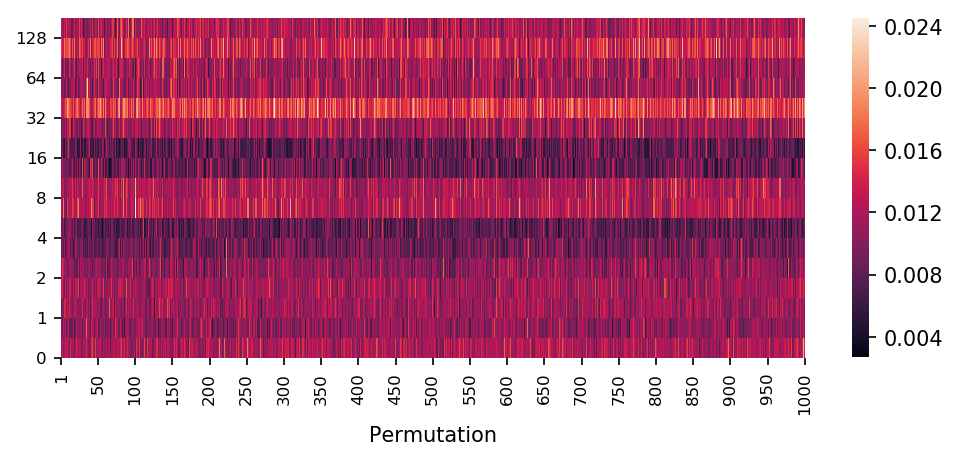

In [426]:
ax = sns.heatmap(info.bs_mrls)
ax.set_xticks(np.linspace(0, 999, num=21, dtype=int))
ax.set_xticklabels(1 + np.linspace(0, 999, num=21, dtype=int), fontsize=8)
ax.set_xlabel('Permutation')
ax.set_yticks(np.arange(len(freqs))[::2])
ax.set_yticklabels(np.round(freqs[::2]).astype(int), rotation=0, fontsize=8)
ax.invert_yaxis()
fig.show()

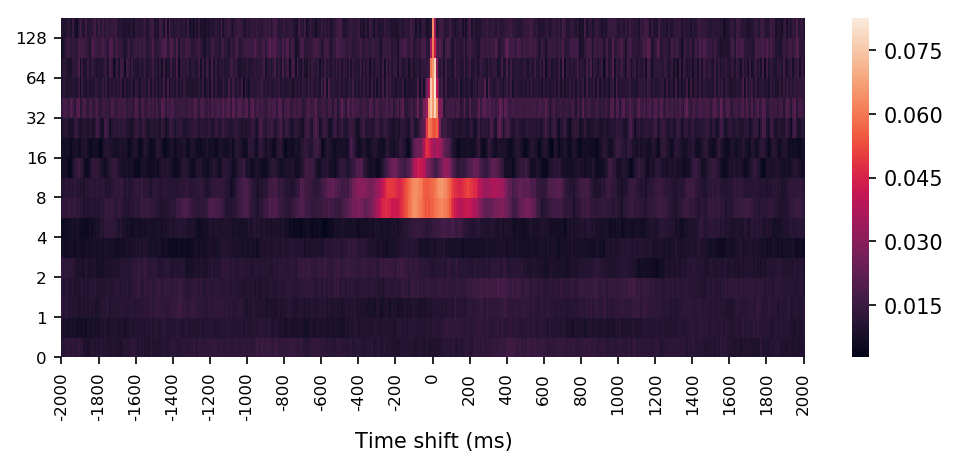

In [427]:
ax = sns.heatmap(info.tl_mrls)
ax.set_xticks(np.linspace(0, 400, num=21, dtype=int))
ax.set_xticklabels(time_steps_ms[np.linspace(0, 400, num=21, dtype=int)].astype(int), fontsize=8)
ax.set_xlabel('Time shift (ms)')
ax.set_yticks(np.arange(len(freqs))[::2])
ax.set_yticklabels(np.round(freqs[::2]).astype(int), rotation=0, fontsize=8)
ax.invert_yaxis()
fig.show()

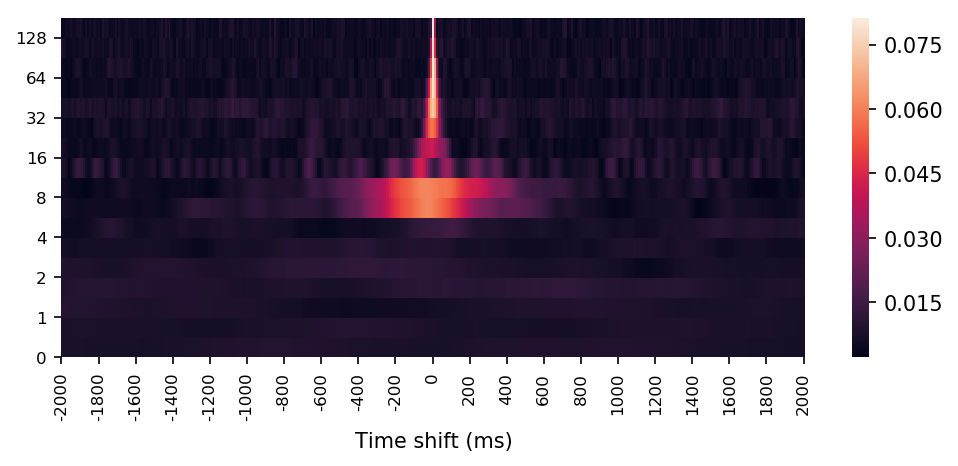

In [419]:
ax = sns.heatmap(info_.tl_mrls[:, 300:701])
ax.set_xticks(np.linspace(0, 400, num=21, dtype=int))
ax.set_xticklabels(time_steps_ms[np.linspace(0, 400, num=21, dtype=int)].astype(int), fontsize=8)
ax.set_xlabel('Time shift (ms)')
ax.set_yticks(np.arange(len(freqs))[::2])
ax.set_yticklabels(np.round(freqs[::2]).astype(int), rotation=0, fontsize=8)
ax.invert_yaxis()
fig.show()

In [999]:
reload(phase_locking)
from phase_locking import calc_phase_locking_mrl_morlet_unit_to_region

In [1028]:
u2r_df.query("(unit_chan_ind==1) & (same_hemroi==True)")
u2r_df.query("(unit_chan_ind==3) & (same_hemroi==True) & (unit==3)")

,subj_sess,subj_sess_unit,unit,unit_chan_ind,unit_hemroi,unit_hem,unit_roi,unit_is_hpc,unit_nspikes,unit_fr,lfp_hemroi,lfp_hem,lfp_roi,lfp_is_hpc,same_chan,same_hemroi,same_hem,same_roi,both_hpc,unit_hemroi2,lfp_hemroi2,unit_roi2,lfp_roi2,same_roi2,lfp_chan_inds,edge
164,U369_env1,U369_env1_3,3,3,RA,R,A,0,513,0.40453,RA,R,A,0,0,1,1,1,0,ramy,ramy,amy,amy,True,"[0, 1, 2, 4, 5, 6, 7]",ctx-local


In [1026]:
pl_df.query("(unit_chan_ind==3) & (same_hemroi==True) & (unit==3)")

,subj_sess,subj_sess_unit,unit,unit_chan_ind,unit_hemroi,unit_hem,unit_roi,unit_is_hpc,unit_nspikes,unit_fr,lfp_hemroi,lfp_hem,lfp_roi,lfp_is_hpc,same_chan,same_hemroi,same_hem,same_roi,both_hpc,unit_hemroi2,lfp_hemroi2,unit_roi2,lfp_roi2,same_roi2,lfp_chan_inds,edge,bs_mrls,tl_mrls,mrls,locked_freq_ind,locked_mrl,bs_ind,bs_pval,sig,tl_locked_time_ind,tl_locked_time,tl_locked_time_mrl,tl_bs_ind,tl_bs_pval,tl_bs_sig,mrls_z,locked_freq_ind_z,locked_mrl_z,bs_ind_z,bs_pval_z,sig_z,tl_locked_time_ind_z,tl_locked_time_z,tl_locked_time_mrl_z,tl_bs_ind_z,tl_bs_pval_z,tl_bs_sig_z,bs_mrls_z,sig_z_fdr,tl_mrls_z
46,U369_env1,U369_env1_3,3,3,RA,R,A,0,513,0.40453,RA,R,A,False,False,True,True,True,False,ramy,ramy,amy,amy,True,"[0, 1, 2, 4, 5, 6, 7]",ctx-local,"[[0.06274344034504954, 0.05920513833717582, 0....","[[0.06852075891806263, 0.06850509524219368, 0....","[0.05497340335513116, 0.05425260126178342, 0.0...",16,0.097637,0,0.0002,True,500,0.0,0.097637,"[959, 962, 785, 588, 475, 390, 337, 313, 295, ...","[0.19196160767846432, 0.1925614877024595, 0.15...","[False, False, False, False, False, False, Fal...","[-0.3402379540550361, -0.2063385008874607, -1....",16,6.312532,0,0.0002,True,500,0.0,6.312532,"[692, 962, 254, 141, 274, 141, 337, 313, 295, ...","[0.13857228554289142, 0.1925614877024595, 0.05...","[False, False, False, False, False, False, Fal...","[[0.3465834357322109, 0.03382025253398484, -1....",True,"[[-0.2727930589640299, -0.2664925613670956, -0..."


In [1032]:
start_time = time()

subj_sess = 'U369_env1'

u2r_file = '{}_unit_to_lfp-region_pairs_df.pkl'.format(subj_sess)
u2r_path = os.path.join('/scratch/dscho/unit_activity_and_hpc_theta/data/crosselec_phase_locking/metadata', u2r_file)
u2r_df = dio.open_pickle(u2r_path)
info = u2r_df.iloc[164].copy()

info = calc_phase_locking_mrl_morlet_unit_to_region(info,
                                                    n_freqs=17,
                                                    sampling_rate=500,
                                                    time_win=2,
                                                    n_bootstraps=1000,
                                                    remove_cospikes=False,
                                                    cospike_steps=2,
                                                    save_outputs=True,
                                                    input_dir='/scratch/dscho/unit_activity_and_hpc_theta/data/crosselec_phase_locking',
                                                    phase_dir='/scratch/dscho/unit_activity_and_hpc_theta/data/crosselec_phase_locking/wavelet_phase_bband',
                                                    phase_fname='phase-{}-iChan{}-iFreq{}-{}Hz-notch60_120Hz-nospikeinterp-5cycles-17log10freqs_0.5_to_128.0Hz.pkl',
                                                    output_dir='/scratch/dscho/unit_activity_and_hpc_theta/data/crosselec_phase_locking/phase_locking/unit_to_region_bband',
                                                    output_fname='phase_locking_stats-{}-unit_{}-lfp_{}-{}Hz-notch60_120Hz-{}-5cycles-17log10freqs_0.5_to_128.0Hz.pkl',
                                                    sleep_max=0)

print('Done in {:.2f} secs'.format(time() - start_time))

Done in 28.20 secs


In [1021]:
info

subj_sess                                                       U369_env1
subj_sess_unit                                                U369_env1_1
unit                                                                    1
unit_chan_ind                                                           1
unit_hemroi                                                            RA
unit_hem                                                                R
unit_roi                                                                A
unit_is_hpc                                                             0
unit_nspikes                                                         4367
unit_fr                                                           3.46886
lfp_hemroi                                                             RA
lfp_hem                                                                 R
lfp_roi                                                                 A
lfp_is_hpc                            

In [1031]:
stats.pearsonr(pl_df.query("(unit_chan_ind==3) & (same_hemroi==True) & (unit==3)").iloc[0].tl_mrls_z[:, 300:701].flatten(),
               info.tl_mrls_z.flatten())

(0.9413148507314467, 0.0)

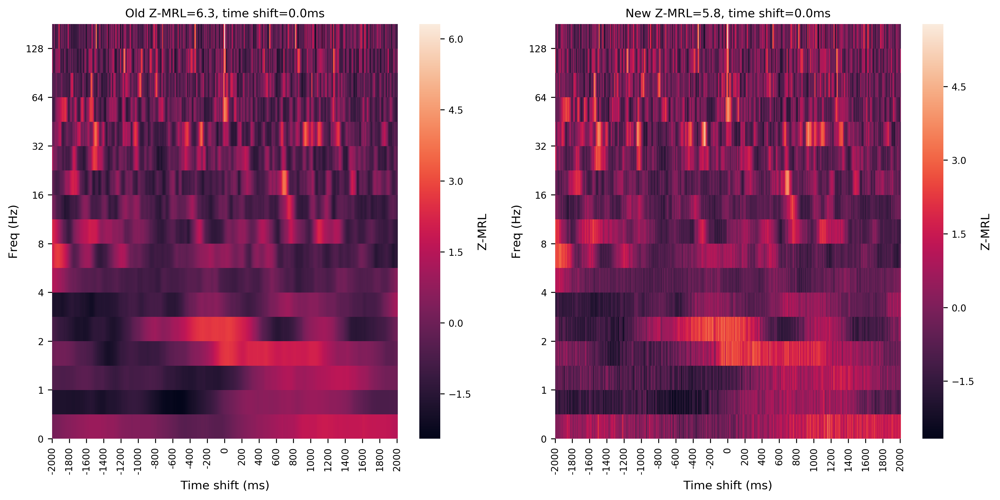

In [1030]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6), dpi=300)
ax = np.ravel(ax)

i = 0
#info_ = pl_df.query("(unit_chan_ind==1) & (same_hemroi==True)").iloc[0]
info_ = pl_df.query("(unit_chan_ind==3) & (same_hemroi==True) & (unit==3)").iloc[0]
sns.heatmap(info_.tl_mrls_z[:, 300:701], ax=ax[i])
ax[i].set_title('Old Z-MRL={:.1f}, time shift={}ms'.format(info_.locked_mrl_z, info_.tl_locked_time_z), fontsize=figfs, y=1.02)

i = 1
info_ = info
sns.heatmap(info_.tl_mrls_z, ax=ax[i])
ax[i].set_title('New Z-MRL={:.1f}, time shift={}ms'.format(info_.locked_mrl_z, info_.tl_locked_time_z), fontsize=figfs, y=1.02)

for i in range(2):
    ax[i].set_xticks(np.linspace(0, 400, num=21, dtype=int))
    ax[i].set_xticklabels(time_steps_ms[300+np.linspace(0, 400, num=21, dtype=int)].astype(int), fontsize=tickfs)
    ax[i].set_yticks(np.arange(len(freqs))[::2])
    ax[i].set_yticklabels(np.round(freqs[::2]).astype(int), rotation=0, fontsize=tickfs)
    ax[i].invert_yaxis()
    ax[i].set_xlabel('Time shift (ms)', fontsize=labfs)
    ax[i].set_ylabel('Freq (Hz)', fontsize=labfs)
    cbar = ax[i].collections[0].colorbar
    cbar.ax.tick_params(labelsize=tickfs)
    cbar.ax.ticklabel_format()
    cbar.set_label('Z-MRL', fontsize=labfs)
    
fig.tight_layout(w_pad=1.05)

In [1246]:
#subj_sess = 'U369_env1'
#subj_sess = 'U395_ses2'
#subj_sess = 'U370_env1'
subj_sess = 'U387_ses3'

pl_dir = '/scratch/dscho/unit_activity_and_hpc_theta/data/crosselec_phase_locking/phase_locking/unit_to_region_bband'
files = glob(os.path.join(pl_dir, 'phase_locking_stats-{}-*-500Hz-notch60_120Hz-nospikeinterp-5cycles-17log10freqs_0.5_to_128.0Hz.pkl'.format(subj_sess)))
pl_df = pd.DataFrame(dio.open_pickle(files[0])).T
for f in files[1:]:
    pl_df = pl_df.append(dio.open_pickle(f))
pl_df.reset_index(drop=True, inplace=True)

map_dtypes = {'unit_nspikes': np.uint32,
              'unit_fr': np.float64,
              'lfp_is_hpc': np.bool,
              'same_chan': np.bool,
              'same_hemroi': np.bool,
              'same_hem': np.bool,
              'same_roi': np.bool,
              'both_hpc': np.bool,
              'same_roi2': np.bool,
              'locked_freq_ind': np.uint8,
              'locked_mrl': np.float64,
              'bs_ind': np.uint16,
              'bs_pval': np.float64,
              'sig': np.bool,
              'tl_locked_time_ind': np.uint16,
              'tl_locked_time': np.float64,
              'tl_locked_time_mrl': np.float64,
              'locked_freq_ind_z': np.uint8,
              'locked_mrl_z': np.float64,
              'bs_ind_z': np.uint16,
              'bs_pval_z': np.float64,
              'sig_z': np.bool,
              'tl_locked_time_ind_z': np.uint16,
              'tl_locked_time_z': np.float64,
              'tl_locked_time_mrl_z': np.float64}
for col, dtype in map_dtypes.items():
    pl_df[col] = pl_df[col].astype(dtype)
    
# FDR correction
# Tests for phase-locking at any frequency:
# 1) For each connection, the maximum observed Z-score (across frequencies) is compared
#    against the surrogate distribution of maximum Z-scores; this gives an initial P-value
# 2) P-values for all connections for a given edge type are corrected to set 
#    a 5% false discovery rate
def bootstrap_p(x):
    """Return a p-value.
    
    For each connection, the maximum observed Z-score (across frequencies) 
    is compared against the surrogate distribution of maximum Z-scores.
    """
    obs = x.mrls_z # n_freq vec
    null = x.bs_mrls_z # n_freq x n_boot vec
    max_obs = np.max(obs)
    max_null = np.max(null, axis=0)
    n_bootstraps = len(max_null)
    pval = (1 + np.sum(max_null >= max_obs)) / (1 + n_bootstraps)
    return pval

pl_df['bs_mrls_z'] = pl_df.bs_mrls.apply(lambda x: stats.zscore(x, axis=-1))
pl_df['sig_z_fdr'] = False
sampling_rate = 500
time_win = 5
time_steps = np.arange(-time_win*sampling_rate, time_win*sampling_rate+1, sampling_rate*0.01, dtype=int)
time_steps_ms = (time_steps / sampling_rate) * 1000
pl_df['tl_mrls_z'] = pl_df.apply(lambda x: tuple((x['tl_mrls'] - np.expand_dims(np.mean(x['bs_mrls'], axis=-1), axis=-1)) 
                                                 / np.expand_dims(np.std(x['bs_mrls'], axis=-1), axis=-1)), axis=1)
pl_df['tl_mrls_z'] = pl_df.tl_mrls_z.apply(lambda x: np.flip(x, axis=-1))

# Get the time of maximum Z-MRL at the t=0 locked freq within 200 ms of t=0!
pl_df['tl_locked_time_z'] = pl_df.apply(lambda x: time_steps_ms[x.tl_mrls_z[x.locked_freq_ind_z, 300:701].argmax() + 300], axis=1)

for edge_type in ['ctx-local', 'ctx-ctx', 'hpc-local', 'hpc-hpc', 'hpc-ctx', 'ctx-hpc']:
    pvals_in = np.array(pl_df.loc[(pl_df.edge==edge_type)].apply(lambda x: bootstrap_p(x), axis=1).tolist())
    output = sm.stats.multipletests(pvals_in, alpha=0.05, method='fdr_tsbky', is_sorted=False, returnsorted=False)
    sig_out = list(output[0])
    pvals_out = output[1]
    pl_df.loc[(pl_df.edge==edge_type), 'sig_z_fdr'] = sig_out

In [1247]:
spikes, fr_df, _, _ = phase_locking.load_spikes(subj_sess)

u2r_file = '{}_unit_to_lfp-region_pairs_df.pkl'.format(subj_sess)
u2r_path = os.path.join('/scratch/dscho/unit_activity_and_hpc_theta/data/crosselec_phase_locking/metadata', u2r_file)
u2r_df = dio.open_pickle(u2r_path)

# Load the raw LFP.
sampling_rate = 500
_, lfp_preproc = manning_analysis.process_lfp(subj_sess, 
                                              subj_df=subj_df, 
                                              sampling_rate=2000,
                                              resampling_rate=sampling_rate,
                                              notch_freqs=[60, 120],
                                              interpolate=False,
                                              session_spikes=spikes,
                                              ms_before=4,
                                              ms_after=4) # fix interp
freqs = np.logspace(np.log10(0.5), np.log10(128), 17)

In [1248]:
# Get artifactual (locked to the highest freq.) and non-artifactual units
unit_inds = OrderedDict()
unit_inds['good_ctx-local'] = pl_df.query("(edge=='ctx-local') & (sig_z_fdr==True) & (locked_freq_ind_z<16)").sort_values('locked_mrl_z', ascending=False).index.tolist()
unit_inds['bad_ctx-local'] = pl_df.query("(edge=='ctx-local') & (sig_z_fdr==True) & (locked_freq_ind_z==16)").sort_values('locked_mrl_z', ascending=False).index.tolist()
unit_inds['good_ctx-hpc'] = pl_df.query("(edge=='ctx-hpc') & (sig_z_fdr==True) & (locked_freq_ind_z<16)").sort_values('locked_mrl_z', ascending=False).index.tolist()
unit_inds['bad_ctx-hpc'] = pl_df.query("(edge=='ctx-hpc') & (sig_z_fdr==True) & (locked_freq_ind_z==16)").sort_values('locked_mrl_z', ascending=False).index.tolist()
unit_inds['not_phase_locked'] = pl_df.query("(edge==['ctx-local', 'ctx-hpc']) & (sig_z_fdr==False)").sort_values('locked_mrl_z', ascending=False).index.tolist()
np.random.shuffle(unit_inds['not_phase_locked'])
for key, val in unit_inds.items():
    print(key, len(val))

good_ctx-local 14
bad_ctx-local 4
good_ctx-hpc 28
bad_ctx-hpc 0
not_phase_locked 8


In [1249]:
# Get spike waveforms
# Get WaveClus output for each channel in the session.
start_time = time()

spike_dir = '/data/continuous'
fname = os.path.join(spike_dir, subj_sess.split('_')[0], subj_sess.split('_')[1], 'cheetah', 'times_CSC{}.mat')
sampling_rate = 500
time_win = 2
max_spike_waves = 200
max_lfp_waves = 3

cut_inds = int(sampling_rate * time_win)
wave_clus = []
unit_chans = []
check_units = []
for unit_type in unit_inds.keys():
    for iUnit in range(len(unit_inds[unit_type])):
        row = pl_df.loc[unit_inds[unit_type][iUnit]]
        unit = row.unit
        chan = fr_df.query("(clus=={})".format(unit)).chan.iat[0]
        chan_clus = fr_df.query("(clus=={})".format(unit)).chan_clus.iat[0]
        fr = fr_df.query("(clus=={})".format(unit)).mean_fr.iat[0]
        unit_hemroi = row.unit_hemroi
        lfp_hemroi = row.lfp_hemroi
        locked_freq = freqs[row.locked_freq_ind_z]
        locked_strength = row.locked_mrl_z
        locked_time = row.tl_locked_time_z
        tl_mrls = row.tl_mrls_z
        
        # Get the spike waveforms.
        dat = sio.loadmat(fname.format(chan))
        chan_clus_ = [x for x in np.unique(dat['cluster_class'][:, 0]) if x != 0][chan_clus]
        spike_waves = dat['spikes'][dat['cluster_class'][:, 0]==chan_clus_, :]
        if len(spike_waves) > max_spike_waves:
            wave_inds = np.linspace(0, len(spike_waves)-1, num=max_spike_waves, dtype=int)
            spike_waves = spike_waves[wave_inds, :]
        spike_waves = np.array(spike_waves)
        
        # Get LFP waves and the STAs.
        lfp_chan_inds = u2r_df.query("(subj_sess=='{}') & (unit=={}) & (lfp_hemroi=='{}')".format(subj_sess, unit, lfp_hemroi)).lfp_chan_inds.iat[0]
        spike_inds, n_timepoints = dio.open_pickle(os.path.join('/scratch/dscho/unit_activity_and_hpc_theta/data/crosselec_phase_locking', 
                                                                'spike_inds', 'spike_inds-{}Hz-{}-unit{}.pkl'
                                                                .format(sampling_rate, subj_sess, unit)))
        spike_inds = spike_inds[(spike_inds>cut_inds) & (spike_inds<(n_timepoints-cut_inds))]
        spike_inds = np.unique(spike_inds)
        lfp_waves = []
        n_spikes = len(spike_inds)
        if n_spikes > max_lfp_waves:
            inds = np.linspace(0, n_spikes-1, num=max_lfp_waves, dtype=int)
        else:
            inds = np.arange(n_spikes)
        for chan_ind in lfp_chan_inds:
            lfp_waves_ = []
            for spike_ind in spike_inds:
                lfp_waves_.append(lfp_preproc.data[chan_ind, spike_ind-cut_inds:spike_ind+cut_inds+1])
            lfp_waves.append(lfp_waves_)
        
        lfp_waves = np.array(lfp_waves) # chan x spike_event x time
        lfp_stas = np.mean(lfp_waves, axis=1)
        lfp_stas100 = np.mean(lfp_waves[:, np.random.choice(np.arange(n_spikes), 100, replace=False), :], axis=1)
        lfp_waves = lfp_waves[:, inds, :]
        
        check_units.append([unit, chan, unit_hemroi, lfp_hemroi, fr, n_spikes, unit_type, lfp_chan_inds, locked_freq, 
                            locked_strength, locked_time, tl_mrls, spike_waves, lfp_waves, lfp_stas, lfp_stas100])
        
check_units = pd.DataFrame(check_units, columns=['unit', 'chan', 'unit_hemroi', 'lfp_hemroi', 'fr', 'n_spikes', 'unit_type', 'lfp_chan_inds', 'locked_freq', 
                                                 'locked_strength', 'locked_time', 'tl_mrls', 'spike_waves', 'lfp_waves', 'lfp_stas', 'lfp_stas100'])

print('Done in {:.2f} secs'.format(time() - start_time))

Done in 44.10 secs


In [1250]:
lfp_preproc

<xarray.TimeSeries 'U387_ses3' (channel: 64, time: 920338)>
array([[1.190743e-04, 1.318930e-04, 1.379833e-04, ..., 1.096686e-04,
        1.137364e-04, 1.149909e-04],
       [8.797379e-05, 1.056796e-04, 1.079493e-04, ..., 8.009574e-05,
        8.367775e-05, 8.623043e-05],
       [5.867435e-05, 6.229213e-05, 7.740533e-05, ..., 7.979084e-05,
        8.249029e-05, 8.983631e-05],
       ...,
       [9.950295e-05, 7.120599e-05, 7.483671e-05, ..., 6.139075e-05,
        4.497996e-05, 5.862639e-05],
       [1.030109e-04, 7.284185e-05, 8.247669e-05, ..., 5.445320e-05,
        4.436893e-05, 5.974907e-05],
       [1.338627e-04, 9.319847e-05, 9.877072e-05, ..., 9.723318e-05,
        8.342475e-05, 8.805948e-05]])
Coordinates:
  * channel     (channel) <U2 '1' '2' '3' '4' '5' '6' '7' '8' '9' '10' '11' ...
  * time        (time) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 ...
    samplerate  int64 500
Attributes:
    process_tag:  resample-500Hz_notch60Hz_notch120Hz

(<Figure size 3600x4800 with 6 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x2ad4b6d1fe10>,
       dtype=object))

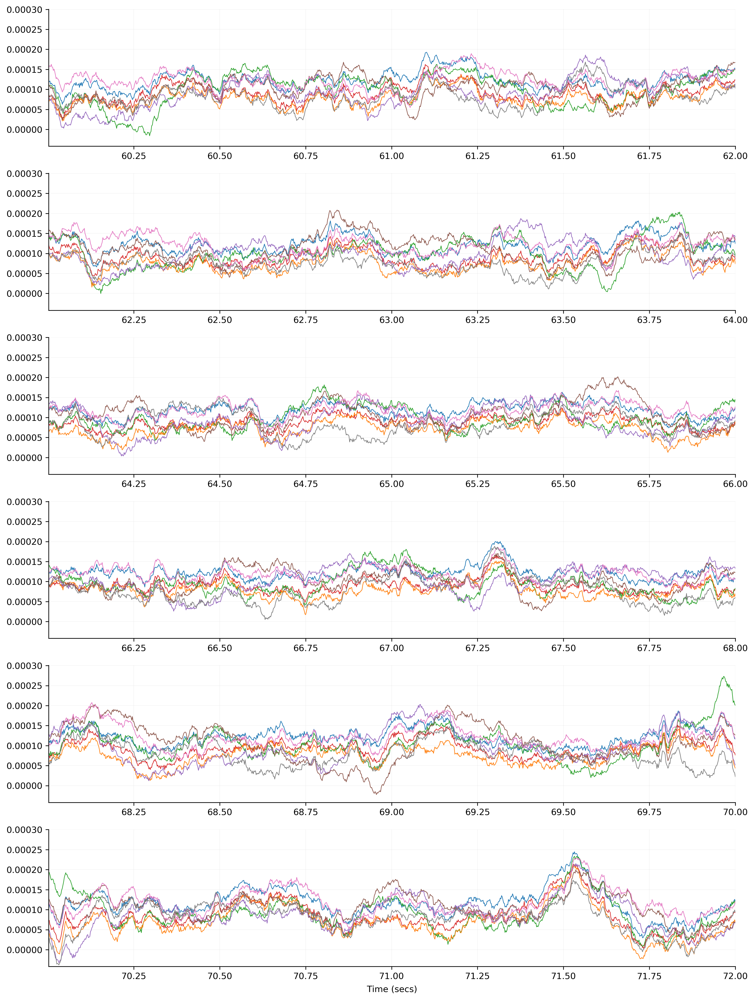

In [1257]:
plot_trace2(lfp_preproc.data[0:8, :], start=60, duration=12, sampling_rate=int(lfp_preproc.samplerate))

In [ ]:
# Plot the units.
tickfs = 8
labfs = 10
figfs = 10
max_figs = 2
figsize = (20, 36)

for unit_type in unit_inds.keys():
    print(unit_type)
    
    if len(unit_inds[unit_type]) == 0:
        continue
    df = check_units.query("(unit_type=='{}')".format(unit_type)).copy()
    
    fig, ax = plt.subplots(10, 4, figsize=figsize, dpi=300)
    ax = np.ravel(ax)

    iRow = 0
    fig_n = 0
    for iUnit in range(len(df)):
        row = df.iloc[iUnit]
        
        i = (4 * iRow) + 0
        for iSpike in range(len(row.spike_waves)):
            ax[i].plot(row.spike_waves[iSpike, :], linewidth=0.1, color=colors[1])
        mean_wave = np.mean(row.spike_waves, axis=0)
        std_wave = np.std(row.spike_waves, axis=0)
        ax[i].plot(mean_wave, linewidth=1, linestyle='-', color='k')
        ax[i].plot(mean_wave + std_wave, linewidth=0.5, linestyle='--', color='k')
        ax[i].plot(mean_wave - std_wave, linewidth=0.5, linestyle='--', color='k')
        ax[i].tick_params(axis='x', labelsize=tickfs)
        ax[i].tick_params(axis='y', labelsize=tickfs)
        ax[i].set_xlabel('Time (samples)', fontsize=labfs)
        ax[i].set_ylabel('μV', fontsize=labfs)
        ax[i].set_title('Spike waveforms ch{} {}: {:.1f}Hz FR, {} spikes'.format(row.chan, row.unit_hemroi, row.fr, row.n_spikes), fontsize=figfs, y=1.02)
        
        i = (4 * iRow) + 1
        lfp_waves = row.lfp_waves - np.expand_dims(np.mean(row.lfp_waves, axis=1), axis=1)
        lfp_waves = lfp_waves + np.expand_dims(np.expand_dims(np.arange(lfp_waves.shape[0]) * 1.2 * (np.percentile(lfp_waves, 99) - np.percentile(lfp_waves, 1)), axis=-1), axis=-1)
        for iLfp in range(lfp_waves.shape[0]):
            for iSpike in range(lfp_waves.shape[1]):
                ax[i].plot(lfp_waves[iLfp, iSpike, :], linewidth=0.25, color=colors[iLfp])
        ax[i].set_xticks(np.linspace(0, 2000, num=21, dtype=int))
        ax[i].set_xticklabels(np.linspace(-2000, 2000, num=21, dtype=int), rotation=90, fontsize=tickfs)
        ax[i].set_yticks([])
        ax[i].set_xlabel('Time to spike (ms)', fontsize=labfs)
        ax[i].set_title('Example LFPs ({})'.format(row.lfp_hemroi), fontsize=figfs, y=1.02)
        
        i = (4 * iRow) + 2
        lfp_stas = row.lfp_stas - np.expand_dims(np.mean(row.lfp_stas, axis=1), axis=1)
        lfp_stas = lfp_stas + np.expand_dims(np.arange(len(lfp_stas)) * (np.max(lfp_stas) - np.min(lfp_stas)), axis=1)
        for iLfp in range(len(lfp_stas)):
            ax[i].plot(lfp_stas[iLfp, :], linewidth=0.75, color=colors[iLfp])
        ax[i].set_xticks(np.linspace(0, 2000, num=21, dtype=int))
        ax[i].set_xticklabels(np.linspace(-2000, 2000, num=21, dtype=int), rotation=90, fontsize=tickfs)
        ax[i].set_yticks([])
        ax[i].set_xlabel('Time to spike (ms)', fontsize=labfs)
        ax[i].set_title('STA: Locked at {:.1f}Hz, Z-MRL={:.1f}'.format(row.locked_freq, row.locked_strength), fontsize=figfs, y=1.02)

        i = (4 * iRow) + 3
        ax[i] = sns.heatmap(row.tl_mrls[:, 300:701], vmin=0, cbar_kws={'format': '%.1f'}, ax=ax[i])
        ax[i].set_xticks(np.linspace(0, 400, num=21, dtype=int))
        ax[i].set_xticklabels(time_steps_ms[300+np.linspace(0, 400, num=21, dtype=int)].astype(int), fontsize=tickfs)
        ax[i].set_yticks(np.arange(len(freqs))[::2] + 0.5)
        ax[i].set_yticklabels([np.round(freqs[::2]).astype(int), rotation=0, fontsize=tickfs)
        ax[i].invert_yaxis()
        ax[i].set_xlabel('Time shift (ms)', fontsize=labfs)
        ax[i].set_ylabel('Freq (Hz)', fontsize=labfs)
        cbar = ax[i].collections[0].colorbar
        cbar.ax.tick_params(labelsize=tickfs)
        cbar.ax.ticklabel_format()
        cbar.set_label('Z-MRL', fontsize=labfs)
        ax[i].set_title('Locked time shift={}ms'.format(row.locked_time), fontsize=figfs, y=1.02)
        
        i = (4 * iRow) + 0
        if iRow == 9:
            ax[i].set_xlabel('Time (samples)', fontsize=labfs)
            ax[i+1].set_xlabel('Time to spike (ms)', fontsize=labfs)
            ax[i+2].set_xlabel('Time to spike (ms)', fontsize=labfs)
            ax[i+3].set_xlabel('Time shift (ms)', fontsize=labfs)
        else:
            ax[i].set_xlabel('', fontsize=labfs)
            ax[i+1].set_xlabel('', fontsize=labfs)
            ax[i+2].set_xlabel('', fontsize=labfs)
            ax[i+3].set_xlabel('', fontsize=labfs)
            
        iRow += 1
        if iRow == 10:
            fig.suptitle('{} {} units'.format(subj_sess, unit_type), y=0.98, fontsize=12)
            fig.tight_layout(w_pad=1.05, h_pad=1.05, rect=(0, 0, 1, 0.97))
            plt.savefig(os.path.join('/scratch/dscho/unit_activity_and_hpc_theta/figs', '{}_{}_units_check{}.png'.format(subj_sess, unit_type, fig_n)))
            fig_n += 1
            if fig_n == max_figs:
                break
            iRow = 0
            plt.close('all')
            fig, ax = plt.subplots(10, 4, figsize=figsize, dpi=300)
            ax = np.ravel(ax)
    
    fig.suptitle('{} {} units'.format(subj_sess, unit_type), y=0.98, fontsize=12)
    fig.tight_layout(w_pad=1.05, h_pad=1.1, rect=(0, 0, 1, 0.97))
    plt.savefig(os.path.join('/scratch/dscho/unit_activity_and_hpc_theta/figs', '{}_{}_units_check{}.png'.format(subj_sess, unit_type, fig_n)))

good_ctx-local
bad_ctx-local
good_ctx-hpc
bad_ctx-hpc
not_phase_locked


## Spike quality metrics

In [1201]:
pl_df.query("(edge=='ctx-hpc') & (lfp_hemroi=='LAH') & (unit==20)").sort_values('locked_mrl_z', ascending=False).iloc[:20]

,subj_sess,subj_sess_unit,unit,unit_chan_ind,unit_hemroi,unit_hem,unit_roi,unit_is_hpc,unit_nspikes,unit_fr,lfp_hemroi,lfp_hem,lfp_roi,lfp_is_hpc,same_chan,same_hemroi,same_hem,same_roi,both_hpc,unit_hemroi2,lfp_hemroi2,unit_roi2,lfp_roi2,same_roi2,lfp_chan_inds,edge,bs_mrls,tl_mrls,mrls,locked_freq_ind,locked_mrl,bs_ind,bs_pval,sig,tl_locked_time_ind,tl_locked_time,tl_locked_time_mrl,tl_bs_ind,tl_bs_pval,tl_bs_sig,mrls_z,locked_freq_ind_z,locked_mrl_z,bs_ind_z,bs_pval_z,sig_z,tl_locked_time_ind_z,tl_locked_time_z,tl_locked_time_mrl_z,tl_bs_ind_z,tl_bs_pval_z,tl_bs_sig_z,bs_mrls_z,sig_z_fdr,tl_mrls_z
69,U370_env1,U370_env1_20,20,35,LA,L,A,0,644,0.370374,LAH,L,AH,True,False,False,True,False,False,lamy,lhpc,amy,hpc,False,"[40, 41, 42, 43, 44, 45, 46, 47]",ctx-hpc,"[[0.024687993462320756, 0.03235039268783855, 0...","[[0.03869776063134826, 0.038632750142342194, 0...","[0.04303604488508589, 0.04230034160289718, 0.0...",8,0.089279,0,0.0002,True,502,20.0,0.091306,"[185, 164, 136, 76, 74, 115, 115, 275, 341, 18...","[0.03719256148770246, 0.032993401319736056, 0....","[False, False, False, False, False, False, Fal...","[1.246600522637784, 1.3140033379254321, 1.1388...",8,5.50456,0,0.0002,True,502,-20.0,5.709765,"[185, 164, 136, 76, 74, 115, 115, 156, 216, 18...","[0.03719256148770246, 0.032993401319736056, 0....","[False, False, False, False, False, False, Fal...","[[-1.5903362802327201, -0.40559236054940045, -...",True,"[[-0.38228396225460537, -0.3840613326165785, -..."


In [1154]:
import pycircstat

In [1139]:
subj_sess = 'U370_env1'
unit = 20
sampling_rate = 2000
input_dir='/scratch/dscho/unit_activity_and_hpc_theta/data/crosselec_phase_locking'
phase_dir='/scratch/dscho/unit_activity_and_hpc_theta/data/crosselec_phase_locking/wavelet/phase'

spike_inds, n_timepoints = dio.open_pickle(os.path.join(input_dir, 'spike_inds', 'spike_inds-{}Hz-{}-unit{}.pkl'
                                                        .format(sampling_rate, subj_sess, unit)))
spike_inds = np.unique(spike_inds[(spike_inds>cut_inds) & (spike_inds<(n_timepoints-cut_inds))])

iChan = 40
iFreq = 4
phase_fname='phase-{}-iChan{}-iFreq{}-{}Hz-notch60_120Hz-nospikeinterp-5cycles-16log10freqs_0.5_to_90.5Hz.pkl'
phase = dio.open_pickle(os.path.join(phase_dir, phase_fname.format(subj_sess, iChan, iFreq, sampling_rate)))

In [1178]:
time_win = 2
time_steps = np.arange(-time_win*sampling_rate, time_win*sampling_rate+1, sampling_rate*0.01, dtype=int)

In [1195]:
info_in = u2r_df.query("(subj_sess == '{}') & (unit=={}) & (lfp_hemroi=='{}')".format(subj_sess, 20, 'LAH')).iloc[0]

In [1204]:
from phase_locking import calc_phase_locking_mrl_morlet_unit_to_region

In [1205]:
start_time = time()

info = calc_phase_locking_mrl_morlet_unit_to_region(info_in,
                                                    n_freqs=16,
                                                    sampling_rate=2000,
                                                    time_win=2,
                                                    n_bootstraps=1000,
                                                    remove_cospikes=False,
                                                    cospike_steps=2,
                                                    save_outputs=True,
                                                    input_dir='/scratch/dscho/unit_activity_and_hpc_theta/data/crosselec_phase_locking',
                                                    phase_dir='/scratch/dscho/unit_activity_and_hpc_theta/data/crosselec_phase_locking/wavelet/phase',
                                                    phase_fname='phase-{}-iChan{}-iFreq{}-{}Hz-notch60_120Hz-nospikeinterp-5cycles-16log10freqs_0.5_to_90.5Hz.pkl',
                                                    output_dir='/scratch/dscho/unit_activity_and_hpc_theta/data/crosselec_phase_locking/phase_locking/unit_to_region',
                                                    output_fname='phase_locking_stats-{}-unit_{}-lfp_{}-{}Hz-notch60_120Hz-{}-5cycles-17log10freqs_0.5_to_128.0Hz.pkl',
                                                    sleep_max=0)

print('Done in {:.2f} secs'.format(time() - start_time))

Done in 33.71 secs


In [1206]:
info

subj_sess                                                                U370_env1
subj_sess_unit                                                        U370_env1_20
unit                                                                            20
unit_chan_ind                                                                   35
unit_hemroi                                                                     LA
unit_hem                                                                         L
unit_roi                                                                         A
unit_is_hpc                                                                      0
unit_nspikes                                                                   644
unit_fr                                                                   0.370374
lfp_hemroi                                                                     LAH
lfp_hem                                                                          L
lfp_

In [1209]:
circstats.circmoment(info.phase_distances), circstats.circmoment(info.phase_distances_locked_time_z)

((-0.00013915693290746697, 0.5182110571515661),
 (-0.0028643628670880546, 0.5102585021273085))

In [1167]:
circstats.circmoment(phase[spike_inds]), circstats.rayleightest(phase[spike_inds])

((1.7512119337469247, 0.09162980618681357), 1.7996816740692473e-93)

In [1151]:
pref_phase = circstats.circmoment(phase[spike_inds])[0]
spike_phases = phase[spike_inds]

In [1177]:
1.7512119337469247 + 0.671008

2.422219933746925

In [1163]:
pref_phase, spike_phases, len(spike_phases)

(1.7512119337469247,
 array([-1.1035101 ,  1.4618104 ,  1.8750049 , ..., -0.671008  ,
        -0.57972133, -0.49497408], dtype=float32),
 25435)

In [1172]:
pycircstat.descriptive.cdiff(spike_phases, pref_phase)

array([-2.854722  , -0.28940162,  0.12379293, ..., -2.42222   ,
       -2.3309333 , -2.246186  ], dtype=float32)

In [1173]:
pycircstat.descriptive.cdiff(spike_phases, np.repeat(pref_phase, len(spike_phases)))

array([-2.85472207, -0.28940158,  0.12379294, ..., -2.42221992,
       -2.33093328, -2.24618601])

In [1176]:
np.allclose(np.round(pycircstat.descriptive.cdiff(spike_phases, pref_phase), 2),
            np.round(pycircstat.descriptive.cdiff(spike_phases, np.repeat(pref_phase, len(spike_phases))), 2))

True

In [1166]:
pycircstat.descriptive.cdiff(spike_phases, pref_phase), np.abs(pycircstat.descriptive.cdiff(spike_phases, pref_phase))

(array([-2.854722  , -0.28940162,  0.12379293, ..., -2.42222   ,
        -2.3309333 , -2.246186  ], dtype=float32),
 array([2.854722  , 0.28940162, 0.12379293, ..., 2.42222   , 2.3309333 ,
        2.246186  ], dtype=float32))

In [1054]:
fr_df.loc[0]

subj_sess                                              U369_env1
chan                                                           1
location                                                      RA
pct_interp                                            0.00944533
clus                                                           0
chan_clus                                                      0
mean_fr                                                  1.49037
fr             [0.0008436540078203249, 0.0008445737773282454,...
spikes         [False, False, False, False, False, False, Fal...
interp_mask    [False, False, False, False, False, False, Fal...
Name: 0, dtype: object

In [518]:
subj = 'U370'
sess = 'env1'
fp_thresh = 0.1
fn_thresh = 0.2

d = '/data3/scratch/ramayya/frLfp/analyses/1-multiUnit0-remSpikes1(-2:8)-6Bands-2-200/qualMetrics'
#cols = ['fn3', 'fp2', 'fn2', 'fn1', 'fp1', 'fp', 'fn', 'isoBG', 'isoNN']
cols = ['fn3', 'fp2', 'fn2', 'fn1', 'fp1', 'fp', 'fn']
unit_dat = []
for iChan in range(64):
    chan = str(iChan+1)
    f = os.path.join(d, '{}-{}-{}.mat'.format(subj, sess, chan))
    if os.path.exists(f):
        dat = sio.loadmat(f)
        for iUnit in range(dat['spikeMetrics'][:, :].shape[1]):
            unit_dat.append([subj, sess, chan, iUnit] + [float(dat['spikeMetrics'][:, iUnit][0][i][0][0]) for i in range(len(cols))])
unit_dat = np.array(unit_dat)
df = pd.DataFrame(unit_dat, 
                  columns=['subj', 'sess', 'chan', 'chan_unit'] + cols)
map_dtypes = {}
map_dtypes['chan_unit'] = int
for col in df.columns[4:]:
    map_dtypes[col] = np.float32
for col, dtype in map_dtypes.items():
    df[col] = df[col].astype(dtype)
df['include'] = (df.fp<fp_thresh) & (df.fn<fn_thresh)

In [573]:
fdir = '/data3/scratch/ramayya/frLfp/analyses/1-multiUnit0-remSpikes1(-2:8)-6Bands-2-200'
dat = sio.loadmat(os.path.join(fdir, 'group_qualMetrics.mat'))

In [555]:
dat['group_qualMetrics'].dtype

dtype([('subj', 'O'), ('sess', 'O'), ('chan', 'O'), ('anatLabel', 'O'), ('sessLength', 'O'), ('baseFr', 'O'), ('isoBG', 'O'), ('isoNN', 'O'), ('fn', 'O'), ('fp', 'O')])

In [584]:
cols = ['subj', 'sess', 'chan', 'anatLabel', 'sessLength', 'baseFr', 'isoBG', 'isoNN', 'fn', 'fp']
d = OrderedDict()
for col in cols:
    d[col] = np.array([x[0][0] for x in np.squeeze(dat['group_qualMetrics'][col])])

In [583]:
np.array([x[0][0] for x in np.squeeze(dat['group_qualMetrics'][col])])

array([0.38253991, 0.0035793 , 0.00374905, ..., 0.00324247, 0.00127242,
       0.00127242])

In [608]:
fp_thresh = 0.2
fn_thresh = 0.2

d = OrderedDict([('subj', np.array([x[0] for x in np.squeeze(dat['group_qualMetrics']['subj'])])),
                 ('sess', np.array([x[0] for x in np.squeeze(dat['group_qualMetrics']['sess'])])),
                 ('chan', np.array([str(x[0][0]) for x in np.squeeze(dat['group_qualMetrics']['chan'])])),
                 ('anatLabel', np.array([x[0] for x in np.squeeze(dat['group_qualMetrics']['anatLabel'])])),
                 ('sessLength', np.array([x[0][0] for x in np.squeeze(dat['group_qualMetrics']['sessLength'])])),
                 ('baseFr', np.array([x[0][0] for x in np.squeeze(dat['group_qualMetrics']['baseFr'])])),
                 ('isoBG', np.array([x[0][0] for x in np.squeeze(dat['group_qualMetrics']['isoBG'])])),
                 ('isoNN', np.array([x[0][0] for x in np.squeeze(dat['group_qualMetrics']['isoNN'])])),
                 ('fn', np.array([x[0][0] for x in np.squeeze(dat['group_qualMetrics']['fn'])])),
                 ('fp', np.array([x[0][0] for x in np.squeeze(dat['group_qualMetrics']['fp'])]))])
df = pd.DataFrame(d)
df['include'] = (df.fp<fp_thresh) & (df.fn<fn_thresh)
df.insert(0, 'subj_sess', df.apply(lambda x: '{}_{}'.format(x.subj, x.sess), axis=1))

In [625]:
df.include.sum(), df.include.mean()

(917, 0.4521696252465483)

In [680]:
unit_inds = []
for units in df.groupby(['subj_sess', 'chan']).apply(lambda x: list(np.arange(len(x)))).tolist():
    for unit in units:
        unit_inds.append(unit)
df['unit'] = unit_inds
df['subj_sess_unit'] = df.apply(lambda x: '{}_{}'.format(x.subj_sess, x.unit), axis=1)

In [753]:
# Load phase-locking stats as a single DataFrame
pl_dir = '/scratch/dscho/unit_activity_and_hpc_theta/data/crosselec_phase_locking/phase_locking/unit_to_region_bband'
pl_df = dio.open_pickle(os.path.join(pl_dir, 'all_phase_locking_stats-13186_unit_to_region_pairs-500Hz-notch60_120Hz-nospikeinterp-5cycles-17log10freqs_0.5_to_128.0Hz.pkl'))

In [460]:
pl_dir = '/scratch/dscho/unit_activity_and_hpc_theta/data/crosselec_phase_locking/phase_locking/unit_to_region_bband'
subj_sess = 'U369_env1'
files = glob(os.path.join(pl_dir, 'phase_locking_stats-{}-*-500Hz-notch60_120Hz-nospikeinterp-5cycles-17log10freqs_0.5_to_128.0Hz.pkl'.format(subj_sess)))
pl_df = pd.DataFrame(dio.open_pickle(files[0])).T
for f in files[1:]:
    pl_df = pl_df.append(dio.open_pickle(f))
pl_df.reset_index(drop=True, inplace=True)

In [462]:
map_dtypes = {'unit_nspikes': np.uint32,
              'unit_fr': np.float64,
              'lfp_is_hpc': np.bool,
              'same_chan': np.bool,
              'same_hemroi': np.bool,
              'same_hem': np.bool,
              'same_roi': np.bool,
              'both_hpc': np.bool,
              'same_roi2': np.bool,
              'locked_freq_ind': np.uint8,
              'locked_mrl': np.float64,
              'bs_ind': np.uint16,
              'bs_pval': np.float64,
              'sig': np.bool,
              'tl_locked_time_ind': np.uint16,
              'tl_locked_time': np.float64,
              'tl_locked_time_mrl': np.float64,
              'locked_freq_ind_z': np.uint8,
              'locked_mrl_z': np.float64,
              'bs_ind_z': np.uint16,
              'bs_pval_z': np.float64,
              'sig_z': np.bool,
              'tl_locked_time_ind_z': np.uint16,
              'tl_locked_time_z': np.float64,
              'tl_locked_time_mrl_z': np.float64}
for col, dtype in map_dtypes.items():
    pl_df[col] = pl_df[col].astype(dtype)

In [463]:
# FDR correction
# Tests for phase-locking at any frequency:
# 1) For each connection, the maximum observed Z-score (across frequencies) is compared
#    against the surrogate distribution of maximum Z-scores; this gives an initial P-value
# 2) P-values for all connections for a given edge type are corrected to set 
#    a 5% false discovery rate
def bootstrap_p(x):
    """Return a p-value.
    
    For each connection, the maximum observed Z-score (across frequencies) 
    is compared against the surrogate distribution of maximum Z-scores.
    """
    obs = x.mrls_z # n_freq vec
    null = x.bs_mrls_z # n_freq x n_boot vec
    max_obs = np.max(obs)
    max_null = np.max(null, axis=0)
    n_bootstraps = len(max_null)
    pval = (1 + np.sum(max_null >= max_obs)) / (1 + n_bootstraps)
    return pval

pl_df['bs_mrls_z'] = pl_df.bs_mrls.apply(lambda x: stats.zscore(x, axis=-1))
pl_df['sig_z_fdr'] = False

for edge_type in ['ctx-local', 'ctx-ctx', 'hpc-local', 'hpc-hpc', 'hpc-ctx', 'ctx-hpc']:
    pvals_in = np.array(pl_df.loc[(pl_df.edge==edge_type)].apply(lambda x: bootstrap_p(x), axis=1).tolist())
    output = sm.stats.multipletests(pvals_in, alpha=0.05, method='fdr_tsbky', is_sorted=False, returnsorted=False)
    sig_out = list(output[0])
    pvals_out = output[1]
    pl_df.loc[(pl_df.edge==edge_type), 'sig_z_fdr'] = sig_out

In [789]:
mdf = pd.merge(df[['subj_sess_unit', 'fn', 'fp', 'include']],
               pl_df.loc[pl_df.edge=='ctx-local',
                         ['subj_sess_unit', 'unit_hemroi', 'lfp_hemroi', 'unit_fr',
                          'locked_freq_ind_z', 'locked_mrl_z', 'sig_z_fdr']],
               how='inner', on='subj_sess_unit')
mdf['hilock'] = list(mdf.locked_freq_ind_z==16)
print(mdf.shape)

(1428, 11)


In [767]:
def dice(v1, v2):
    """Return the Dice coefficient between v1 and v2."""
    v1 = np.array(v1)
    v2 = np.array(v2)
    num = 2 * np.count_nonzero(v1 * v2)
    den = np.count_nonzero(v1) + np.count_nonzero(v2)
    try:
        dc = num / den
    except ZeroDivisionError:
        dc = 0.0
    return dc

In [808]:
mdf.groupby('hilock').agg({'subj_sess_unit': len, 'sig_z_fdr': np.mean, 'include': np.mean, 'fp': np.mean, 'fn': np.mean})

,subj_sess_unit,sig_z_fdr,include,fp,fn
hilock,,,,,
False,622,0.951768,0.429260,0.167779,0.573085
True,806,0.970223,0.452854,0.158877,0.736136


In [809]:
mdf.groupby('include').agg({'subj_sess_unit': len, 'sig_z_fdr': np.mean, 'hilock': np.mean, 'fp': np.mean, 'fn': np.mean})

,subj_sess_unit,sig_z_fdr,hilock,fp,fn
include,,,,,
False,796,0.966080,0.554020,0.327244,1.459763
True,632,0.957278,0.577532,0.032884,0.044792


In [801]:
test_cols = ['sig_z_fdr', 'include']

obs_dice = dice(mdf[test_cols[0]], mdf[test_cols[1]])
v1 = np.array(mdf[test_cols[0]].copy())
v2 = np.array(mdf[test_cols[1]].copy())
n_boot = 10000
bs_dice = []
for i in range(n_boot):
    np.random.shuffle(v1)
    np.random.shuffle(v2)
    bs_dice.append(dice(v1, v2))
bs_dice = np.array(bs_dice)
pval = (1 + np.sum(bs_dice>=obs_dice)) / (1 + n_boot)
print('P = {:.4f}'.format(pval))

P = 0.8439


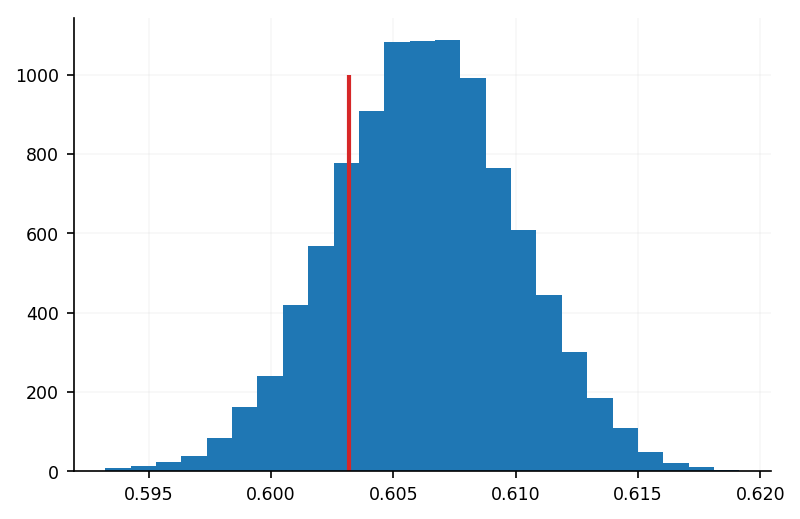

In [805]:
plt.hist(bs_dice, bins=25)
plt.vlines(obs_dice, ymin=0, ymax=1000, linewidth=2, color='C1')
plt.show()

In [1222]:
hpc_rois = ['LAH', 'LMH', 'LPH', 'RAH', 'RMH', 'RPH']

In [1218]:
lfp_preproc.sel(channel=['10', '11', '12', '13'])

<xarray.TimeSeries 'U370_env1' (channel: 4, time: 869392)>
array([[-1.436018e-04, -1.717306e-04, -2.272604e-04, ...,  6.419247e-05,
         1.029010e-04,  1.114775e-04],
       [-7.259377e-05, -1.172818e-04, -1.604415e-04, ...,  8.983758e-05,
         1.141962e-04,  1.273211e-04],
       [-6.925849e-05, -1.229810e-04, -1.729743e-04, ...,  7.089026e-05,
         1.001886e-04,  1.135792e-04],
       [-7.851015e-05, -1.463633e-04, -1.844403e-04, ...,  1.117409e-04,
         1.315319e-04,  1.578406e-04]])
Coordinates:
  * channel     (channel) <U2 '10' '11' '12' '13'
  * time        (time) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 ...
    samplerate  int64 500
Attributes:
    process_tag:  resample-500Hz_notch60Hz_notch120Hz